# Import Libraries

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import Normalizer
from kneed import KneeLocator
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.cluster import SpectralClustering
from sklearn.cluster import Birch
from sklearn.cluster import AffinityPropagation
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots 
import warnings
warnings.filterwarnings('ignore')

In [2]:
# import datasets
Data = pd.read_csv("E:\hamid\hushe masnue imt1\Data\PCA Project/Country-data.csv")
Data

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


- country: 	Name of the country
- =========================================================================================================================
- child_mort: 	Death of children under 5 years of age per 1000 live births
- مرگ کودکان زیر 5 سال در هر 1000 تولد زنده 
- =========================================================================================================================
- exports: 	Exports of goods and services per capita. Given as %age of the GDP per capita
- سرانه صادرات کالا و خدمات . به عنوان درصدی از سرانه تولید ناخالص داخلی در نظر  گرفته شده است
- =========================================================================================================================
- health: 	Total health spending per capita. Given as %age of GDP per capita
- سرانه کل هزینه های بهداشتی
- =========================================================================================================================
- imports: 	Imports of goods and services per capita. Given as %age of the GDP per capita
- سرانه واردات و خدمات ان
- =========================================================================================================================
- Income: 	Net income per person
- درامد خالص
- =========================================================================================================================
- Inflation: 	The measurement of the annual growth rate of the Total GDP
- اندازه گیری نرخ رشد سالانه کل تولید ناخالصی داخلی
- =========================================================================================================================
- life_expec: 	The average number of years a new born child would live if the current mortality patterns are to remain the same
- اگر قرار باشد الگوهای مرگ و میر فعلی ثابت بماند میانگین سال هایی که یک نوزاد تازه متولد شده زندگی می کند
- =========================================================================================================================
- total_fer: 	The number of children that would be born to each woman if the current age-fertility rates remain the same
- اگر نرخ باروری فعلی ثابت بماند تعداد فرزندانی که برای هر زن متولد می شود
- =========================================================================================================================
- gdpp: 	The GDP per capita . Calculated as the total gdp divided by the population.
- سرانه تولید ناخالص داخلی با فرمول تولید ناخالص داخلی کل تقسیم بر کل جمعیت محاسبه شود

In [3]:
Data.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,167.0,38.270060,40.328931,2.6000,8.250,19.30,62.10,208.00
exports,167.0,41.108976,27.412010,0.1090,23.800,35.00,51.35,200.00
health,167.0,6.815689,2.746837,1.8100,4.920,6.32,8.60,17.90
imports,167.0,46.890215,24.209589,0.0659,30.200,43.30,58.75,174.00
income,167.0,17144.688623,19278.067698,609.0000,3355.000,9960.00,22800.00,125000.00
inflation,167.0,7.781832,10.570704,-4.2100,1.810,5.39,10.75,104.00
life_expec,167.0,70.555689,8.893172,32.1000,65.300,73.10,76.80,82.80
total_fer,167.0,2.947964,1.513848,1.1500,1.795,2.41,3.88,7.49
gdpp,167.0,12964.155689,18328.704809,231.0000,1330.000,4660.00,14050.00,105000.00


In [4]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


هیچ میسینگ ولیو نداریم

In [5]:
# makae data2 for numerical features
Data2 = Data.drop("country", axis=1)
Data2

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...
162,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


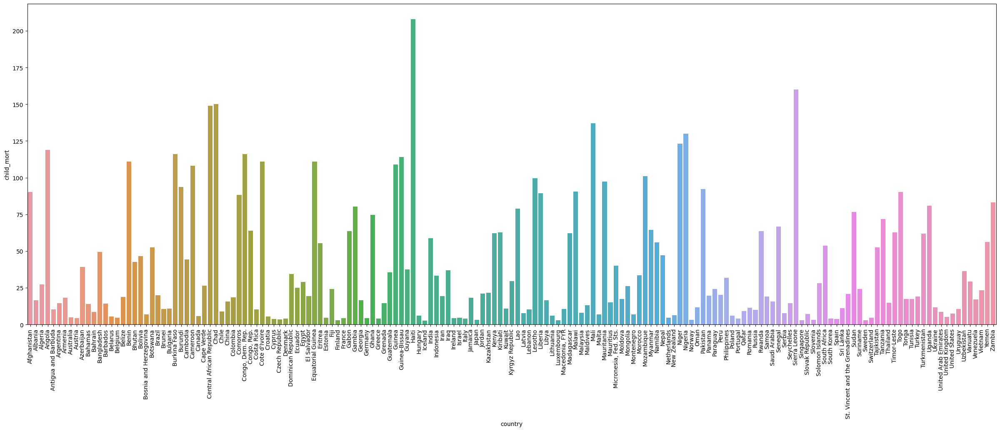

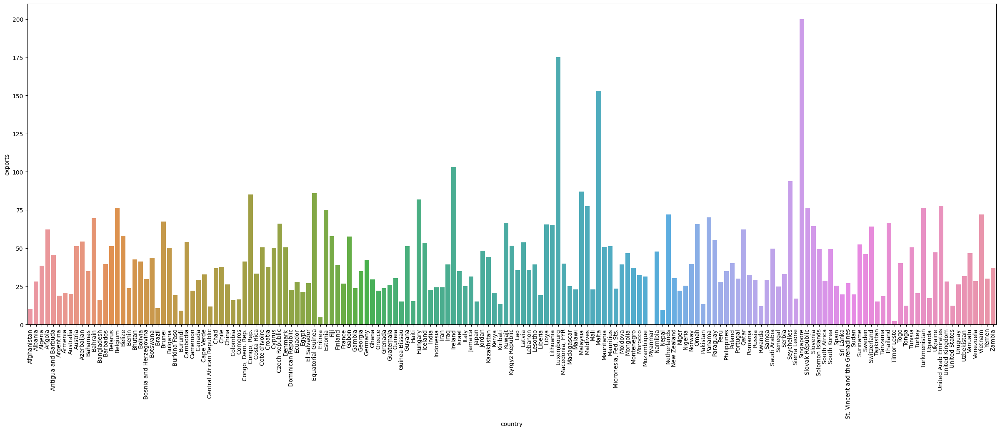

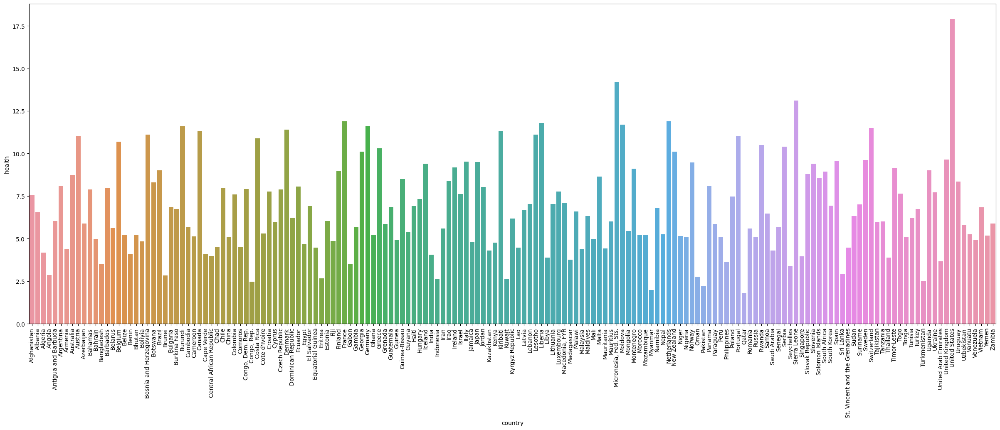

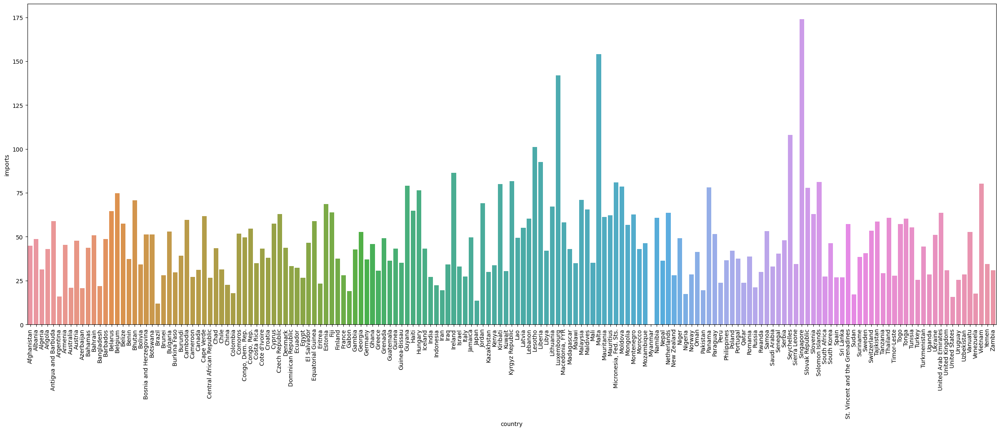

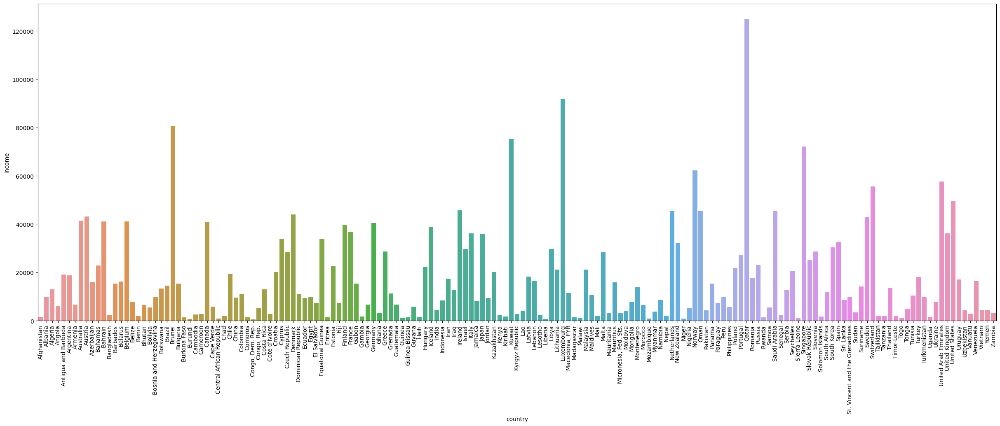

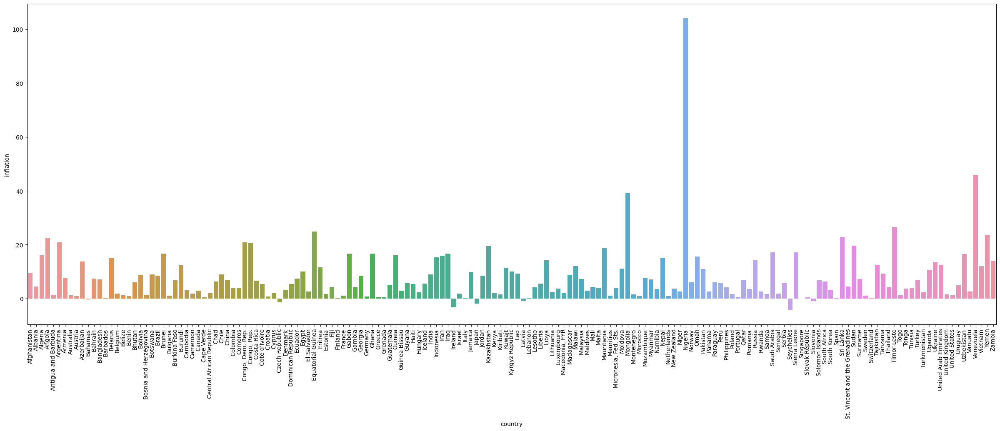

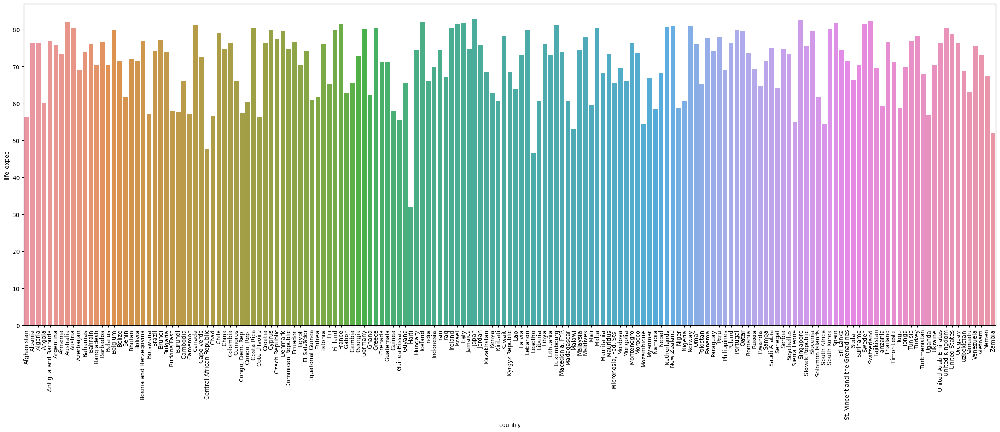

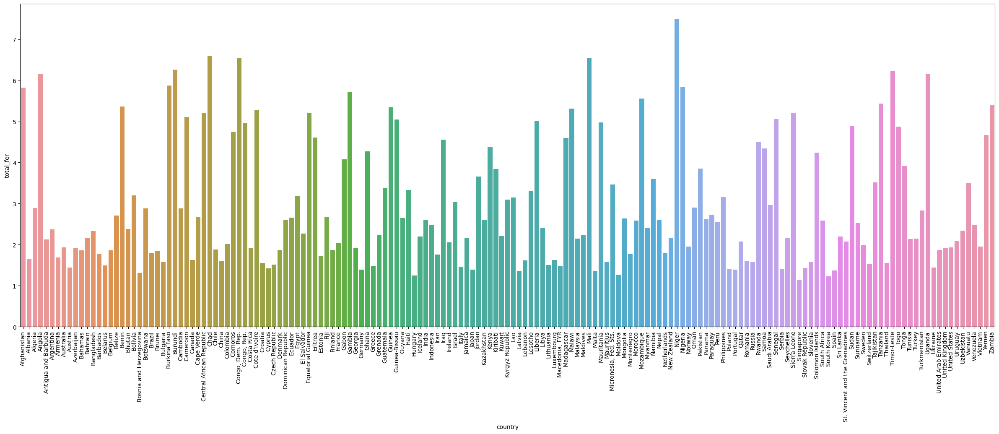

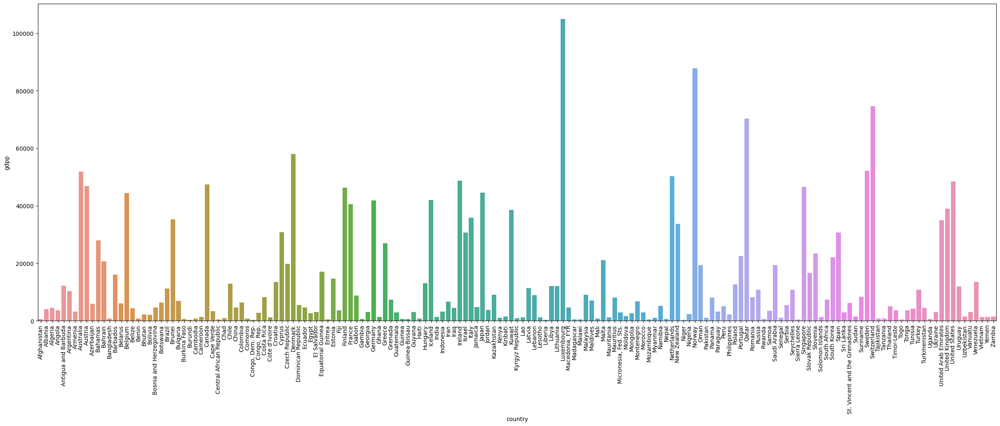

In [6]:
# draw barplot for feauters
columns = ['child_mort', 'exports', 'health', 'imports', 'income','inflation', 'life_expec', 'total_fer', 'gdpp']
for i in columns :
    plt.figure(figsize=(30, 10))
    sns.barplot(Data.country, Data[i])
    plt.xticks(rotation=90)
    plt.show()

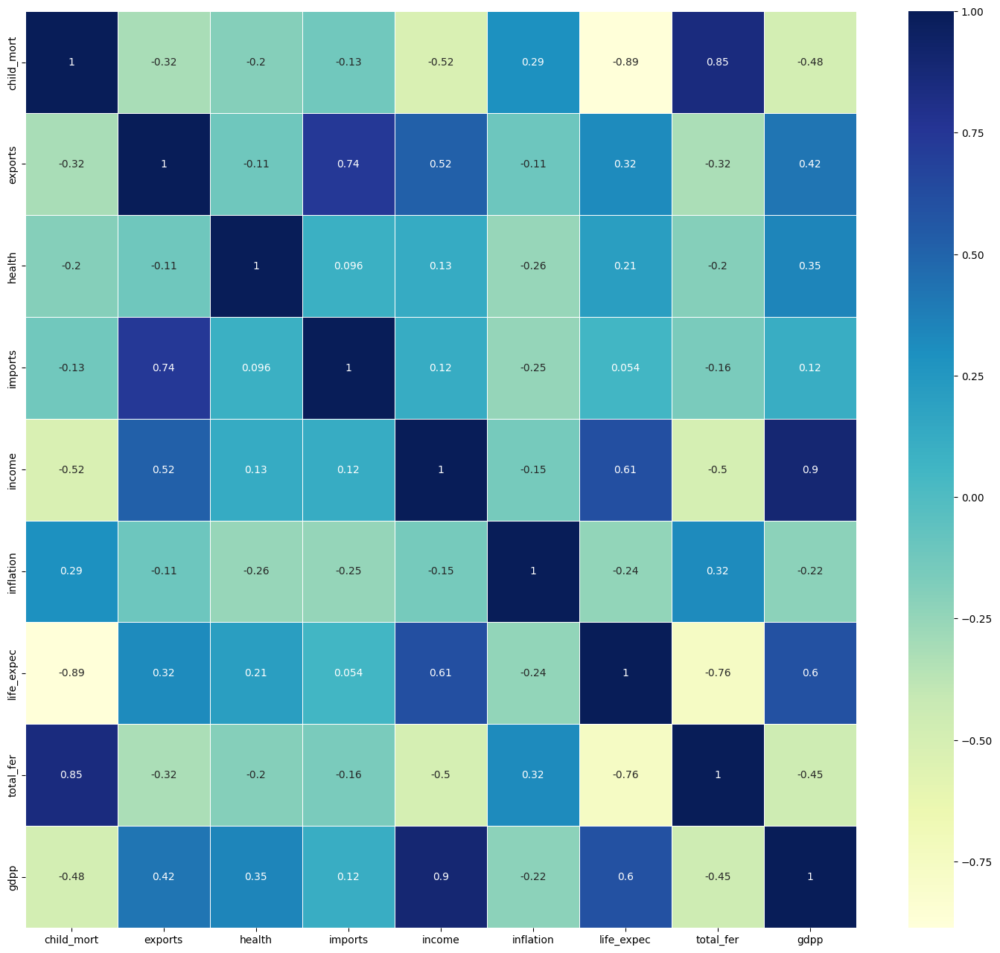

In [7]:
plt.figure(figsize=(18,16))
# make a heatmap for correlation
ax = sns.heatmap(Data.corr(), cmap="YlGnBu", annot=True, linewidths=0.5)
plt.show()

# Preprocessing


## Standardization

In [8]:
scaler = StandardScaler() # preprocessing by standardscaler
Data2_std = scaler.fit_transform(Data2)
Data2_std_df = pd.DataFrame(Data2_std, columns=Data2.columns) # make dataframe for standardization
Data2_std_df

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,1.291532,-1.138280,0.279088,-0.082455,-0.808245,0.157336,-1.619092,1.902882,-0.679180
1,-0.538949,-0.479658,-0.097016,0.070837,-0.375369,-0.312347,0.647866,-0.859973,-0.485623
2,-0.272833,-0.099122,-0.966073,-0.641762,-0.220844,0.789274,0.670423,-0.038404,-0.465376
3,2.007808,0.775381,-1.448071,-0.165315,-0.585043,1.387054,-1.179234,2.128151,-0.516268
4,-0.695634,0.160668,-0.286894,0.497568,0.101732,-0.601749,0.704258,-0.541946,-0.041817
...,...,...,...,...,...,...,...,...,...
162,-0.225578,0.200917,-0.571711,0.240700,-0.738527,-0.489784,-0.852161,0.365754,-0.546913
163,-0.526514,-0.461363,-0.695862,-1.213499,-0.033542,3.616865,0.546361,-0.316678,0.029323
164,-0.372315,1.130305,0.008877,1.380030,-0.658404,0.409732,0.286958,-0.661206,-0.637754
165,0.448417,-0.406478,-0.597272,-0.517472,-0.658924,1.500916,-0.344633,1.140944,-0.637754


## MinMax

In [9]:
minmax = MinMaxScaler() # preprocessing by minmaxscaler
Data2_minmax = minmax.fit_transform(Data2)
Data2_minmax_df = pd.DataFrame(Data2_minmax, columns=Data2.columns) # make dataframe for minmax scaler
Data2_minmax_df

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,0.426485,0.049482,0.358608,0.257765,0.008047,0.126144,0.475345,0.736593,0.003073
1,0.068160,0.139531,0.294593,0.279037,0.074933,0.080399,0.871795,0.078864,0.036833
2,0.120253,0.191559,0.146675,0.180149,0.098809,0.187691,0.875740,0.274448,0.040365
3,0.566699,0.311125,0.064636,0.246266,0.042535,0.245911,0.552268,0.790221,0.031488
4,0.037488,0.227079,0.262275,0.338255,0.148652,0.052213,0.881657,0.154574,0.114242
...,...,...,...,...,...,...,...,...,...
162,0.129503,0.232582,0.213797,0.302609,0.018820,0.063118,0.609467,0.370662,0.026143
163,0.070594,0.142032,0.192666,0.100809,0.127750,0.463081,0.854043,0.208202,0.126650
164,0.100779,0.359651,0.312617,0.460715,0.031200,0.150725,0.808679,0.126183,0.010299
165,0.261441,0.149536,0.209447,0.197397,0.031120,0.257000,0.698225,0.555205,0.010299


# PCA

## PCA Standardscaler

In [10]:
pca_std = PCA()
pca_std_tr = pca_std.fit_transform(Data2_std_df)

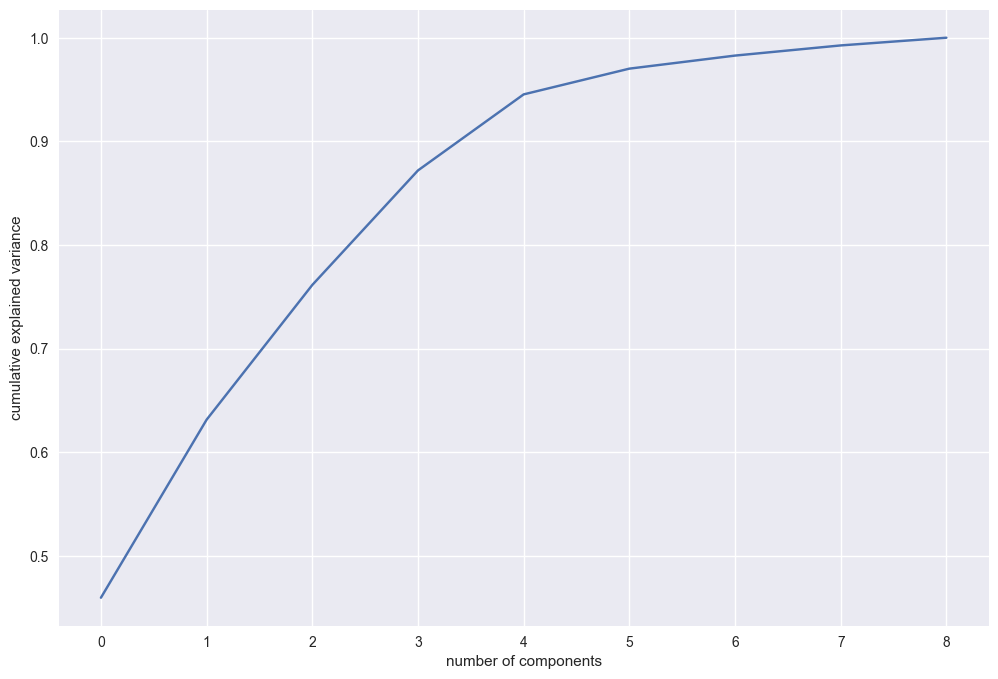

In [11]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
plt.style.use('seaborn')
fig = plt.figure(figsize = (12,8))
plt.plot(np.cumsum(pca_std.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

## PCA MinMAx Scaler

In [12]:
pca_mmax = PCA()
pca_mmax_tr = pca_mmax.fit_transform(Data2_minmax_df)

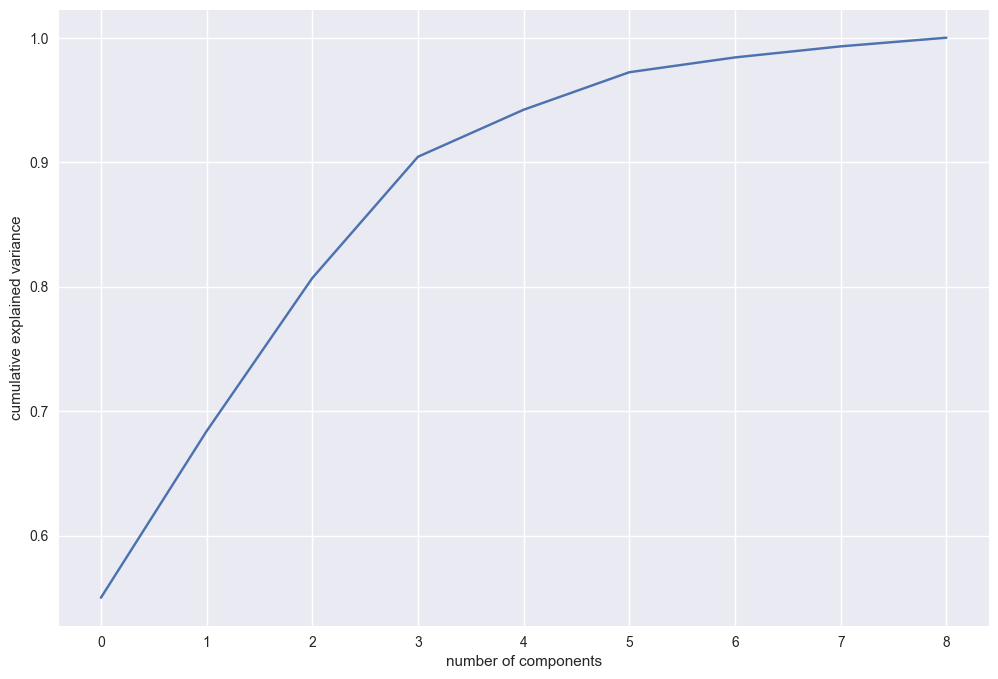

In [13]:
#Making the screeplot - plotting the cumulative variance against the number of components
%matplotlib inline
fig = plt.figure(figsize = (12,8))
plt.style.use('seaborn')
plt.plot(np.cumsum(pca_mmax.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

در مین مکس با سه مولفه بیشتر از 90 درضد دیتاها را شامل می شود

In [14]:
# make pca minmax dataframe by 3 component
pca_mmax_3 = pd.DataFrame(pca_mmax_tr[:, :3], columns=['PCA1', 'PCA2', 'PCA3'])
pca_mmax_3

,PCA1,PCA2,PCA3
0,-0.599078,0.095490,0.157554
1,0.158474,-0.212092,-0.064189
2,0.003686,-0.135867,-0.134182
3,-0.650235,0.275975,-0.142672
4,0.200711,-0.064662,-0.100715
...,...,...,...
162,-0.160078,-0.029625,-0.121910
163,0.061133,-0.171339,-0.058586
164,0.115512,-0.032034,-0.195243
165,-0.332968,-0.019824,-0.029989


In [15]:
# make pca minmax dataframe by 4 component
pca_mmax_4 = pd.DataFrame(pca_mmax_tr[:, :4], columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'])
pca_mmax_4

,PCA1,PCA2,PCA3,PCA4
0,-0.599078,0.095490,0.157554,-0.024333
1,0.158474,-0.212092,-0.064189,-0.061247
2,0.003686,-0.135867,-0.134182,0.133574
3,-0.650235,0.275975,-0.142672,0.156018
4,0.200711,-0.064662,-0.100715,-0.037902
...,...,...,...,...
162,-0.160078,-0.029625,-0.121910,-0.066099
163,0.061133,-0.171339,-0.058586,0.247460
164,0.115512,-0.032034,-0.195243,-0.231993
165,-0.332968,-0.019824,-0.029989,0.105416


In [16]:
# make pca minmax dataframe by 5 component
pca_mmax_5 = pd.DataFrame(pca_mmax_tr[:, :5], columns=['PCA1', 'PCA2', 'PCA3', 'PCA4', 'PCA5'])
pca_mmax_5

,PCA1,PCA2,PCA3,PCA4,PCA5
0,-0.599078,0.095490,0.157554,-0.024333,-0.045618
1,0.158474,-0.212092,-0.064189,-0.061247,0.014191
2,0.003686,-0.135867,-0.134182,0.133574,-0.091150
3,-0.650235,0.275975,-0.142672,0.156018,-0.081997
4,0.200711,-0.064662,-0.100715,-0.037902,-0.035799
...,...,...,...,...,...
162,-0.160078,-0.029625,-0.121910,-0.066099,-0.009043
163,0.061133,-0.171339,-0.058586,0.247460,-0.093260
164,0.115512,-0.032034,-0.195243,-0.231993,-0.035734
165,-0.332968,-0.019824,-0.029989,0.105416,-0.141550


In [17]:
# make pca standard dataframe by 3 component
pca_std_3 = pd.DataFrame(pca_std_tr[:, :3], columns=['PCA1', 'PCA2', 'PCA3'])
pca_std_3

,PCA1,PCA2,PCA3
0,-2.913025,0.095621,-0.718118
1,0.429911,-0.588156,-0.333486
2,-0.285225,-0.455174,1.221505
3,-2.932423,1.695555,1.525044
4,1.033576,0.136659,-0.225721
...,...,...,...
162,-0.820631,0.639570,-0.389923
163,-0.551036,-1.233886,3.101350
164,0.498524,1.390744,-0.238526
165,-1.887451,-0.109453,1.109752


In [18]:
# make pca standard dataframe by 4 component
pca_std_4 = pd.DataFrame(pca_std_tr[:, :4], columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'])
pca_std_4

,PCA1,PCA2,PCA3,PCA4
0,-2.913025,0.095621,-0.718118,1.005255
1,0.429911,-0.588156,-0.333486,-1.161059
2,-0.285225,-0.455174,1.221505,-0.868115
3,-2.932423,1.695555,1.525044,0.839625
4,1.033576,0.136659,-0.225721,-0.847063
...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595
163,-0.551036,-1.233886,3.101350,-0.115311
164,0.498524,1.390744,-0.238526,-1.074098
165,-1.887451,-0.109453,1.109752,0.056257


In [19]:
# make pca standard dataframe by 5 component
pca_std_5= pd.DataFrame(pca_std_tr[:, :5], columns=['PCA1', 'PCA2', 'PCA3', 'PCA4', 'PCA5'])
pca_std_5

,PCA1,PCA2,PCA3,PCA4,PCA5
0,-2.913025,0.095621,-0.718118,1.005255,-0.158310
1,0.429911,-0.588156,-0.333486,-1.161059,0.174677
2,-0.285225,-0.455174,1.221505,-0.868115,0.156475
3,-2.932423,1.695555,1.525044,0.839625,-0.273209
4,1.033576,0.136659,-0.225721,-0.847063,-0.193007
...,...,...,...,...,...
162,-0.820631,0.639570,-0.389923,-0.706595,-0.395748
163,-0.551036,-1.233886,3.101350,-0.115311,2.082581
164,0.498524,1.390744,-0.238526,-1.074098,1.176081
165,-1.887451,-0.109453,1.109752,0.056257,0.618365


In [21]:
# make def for find best number of cluster kmeans by evaluations and compare two preprocessing scaler
def kmean_find_cluster_Compare(k, X, Y):
    
    for i in range(2,k):
        kmean_model = KMeans(n_clusters = i, n_init = 100, random_state = 1)
        kmean_model.fit(X)
        kmean_model.fit(Y)
        y_pred_X = kmean_model.fit_predict(X)
        y_pred_Y = kmean_model.fit_predict(Y)
        print("clusters : ",i," silhouette first dataframe : ",metrics.silhouette_score(X,y_pred_X), "\t Silhouette second dataframe : ",metrics.silhouette_score(Y,y_pred_Y))
        print("clusters : ",i," Calinsky first dataframe : ",metrics.calinski_harabasz_score(X,y_pred_X), "\t Calinsky second dataframe : ",metrics.calinski_harabasz_score(Y,y_pred_Y))
        print("clusters : ",i," David Bouldin first dataframe : ",metrics.davies_bouldin_score(X,y_pred_X), "\t  David Bouldin second dataframe : ",metrics.davies_bouldin_score(Y,y_pred_Y))
        print("\n======================================================================================================\n")             
  

In [22]:
# compare 3 component for minmax dataframe and standard dataframe
kmean_find_cluster_Compare(10, pca_mmax_3, pca_std_3)

clusters :  2  silhouette first dataframe :  0.4623978942049628 	 Silhouette second dataframe :  0.34997710182275643
clusters :  2  Calinsky first dataframe :  157.19487259963253 	 Calinsky second dataframe :  105.4306023035786
clusters :  2  David Bouldin first dataframe :  0.7814723221997897 	  David Bouldin second dataframe :  1.0578801965935722


clusters :  3  silhouette first dataframe :  0.4386320345236684 	 Silhouette second dataframe :  0.37156639781718537
clusters :  3  Calinsky first dataframe :  169.24685514616905 	 Calinsky second dataframe :  88.69516197487157
clusters :  3  David Bouldin first dataframe :  0.8695312402635332 	  David Bouldin second dataframe :  0.8337154139499083


clusters :  4  silhouette first dataframe :  0.435939708716211 	 Silhouette second dataframe :  0.29213683770424187
clusters :  4  Calinsky first dataframe :  154.74983927759774 	 Calinsky second dataframe :  86.45894821925783
clusters :  4  David Bouldin first dataframe :  0.7835072449951139 

In [23]:
# compare 4 component for minmax dataframe and standard dataframe
kmean_find_cluster_Compare(10, pca_mmax_4, pca_std_4)

clusters :  2  silhouette first dataframe :  0.4105304078555464 	 Silhouette second dataframe :  0.32244656378352526
clusters :  2  Calinsky first dataframe :  127.22589875313786 	 Calinsky second dataframe :  86.69356932066506
clusters :  2  David Bouldin first dataframe :  0.9023239081300585 	  David Bouldin second dataframe :  1.1611154409452658


clusters :  3  silhouette first dataframe :  0.3883883667096439 	 Silhouette second dataframe :  0.3340859524580049
clusters :  3  Calinsky first dataframe :  125.84211494014455 	 Calinsky second dataframe :  85.02984394705514
clusters :  3  David Bouldin first dataframe :  1.0095258620433916 	  David Bouldin second dataframe :  1.1305021733781822


clusters :  4  silhouette first dataframe :  0.4006516853527283 	 Silhouette second dataframe :  0.35192526767255156
clusters :  4  Calinsky first dataframe :  110.83408548693116 	 Calinsky second dataframe :  84.1658814865523
clusters :  4  David Bouldin first dataframe :  0.8622609132825285 	

In [24]:
# compare 5 component for minmax dataframe and standard dataframe
kmean_find_cluster_Compare(10, pca_mmax_5, pca_std_5)

clusters :  2  silhouette first dataframe :  0.40119072337167544 	 Silhouette second dataframe :  0.3044199499231817
clusters :  2  Calinsky first dataframe :  118.49697489106366 	 Calinsky second dataframe :  77.0653508429922
clusters :  2  David Bouldin first dataframe :  0.9461912105524934 	  David Bouldin second dataframe :  1.232164857174712


clusters :  3  silhouette first dataframe :  0.36824988780742773 	 Silhouette second dataframe :  0.30797697865190143
clusters :  3  Calinsky first dataframe :  113.84247023703159 	 Calinsky second dataframe :  73.41986360378061
clusters :  3  David Bouldin first dataframe :  1.0494897639612026 	  David Bouldin second dataframe :  1.2038178135668252


clusters :  4  silhouette first dataframe :  0.3797677238451416 	 Silhouette second dataframe :  0.32718347402877207
clusters :  4  Calinsky first dataframe :  98.4713744352211 	 Calinsky second dataframe :  70.39984104354832
clusters :  4  David Bouldin first dataframe :  0.8952672274887692 	 

 دیتای پی سی ای با نرمال سازی مین مکس و تعداد مولفه 3 عدد بهترین گزینه می باشد و با 3 کلاستر که بیشتر بررسی می کنیم تعداد کلاستر را

## Visualization Dataset by 3 components pca

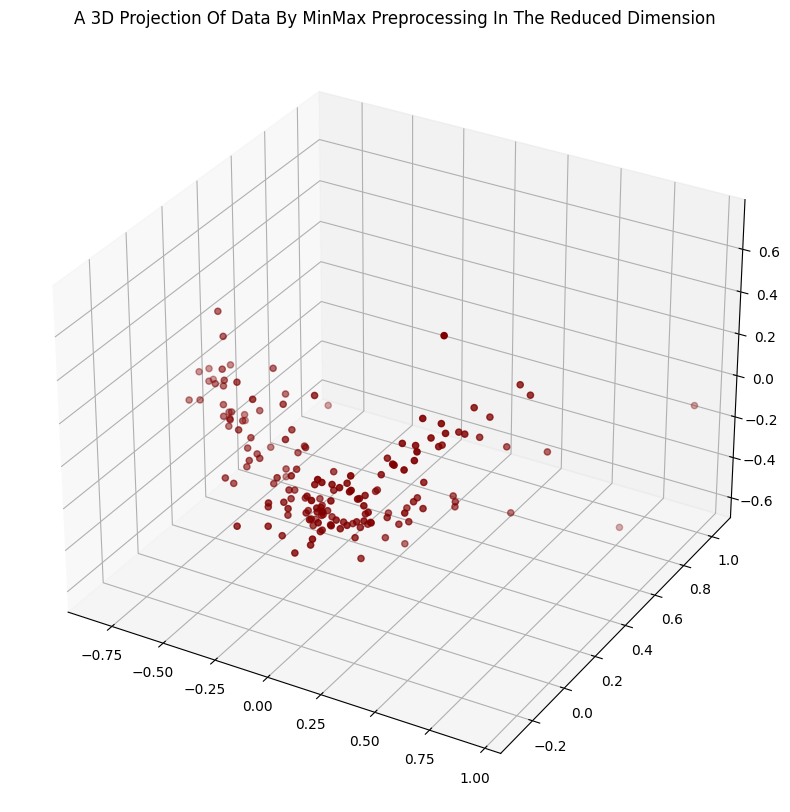

In [25]:
#A 3D Projection Of Min Max Data sets In The Reduced Dimension
x =pca_mmax_3["PCA1"]
y =pca_mmax_3["PCA2"]
z =pca_mmax_3["PCA3"]
#To plot
plt.style.use('default')
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data By MinMax Preprocessing In The Reduced Dimension")
plt.show()

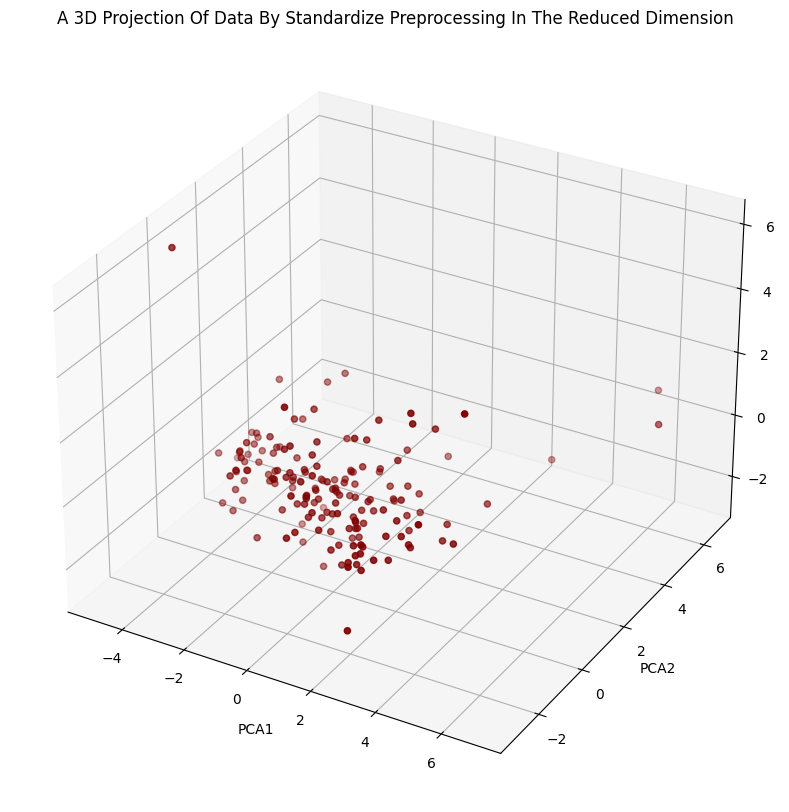

In [26]:
#A 3D Projection Of standard scaler Data sets In The Reduced Dimension
x =pca_std_3["PCA1"]
y =pca_std_3["PCA2"]
z =pca_std_3["PCA3"]
#To plot
plt.style.use('default')
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c="maroon", marker="o" )
ax.set_title("A 3D Projection Of Data By Standardize Preprocessing In The Reduced Dimension")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.show()

همانطور که از داده ها در فضای سه بعدی پیداست مین مکس بهتر کلاستر می شود

# Modeling

## Kmeans

In [27]:
# use elbow for k cluster and X is Dataframe
def kmeans_elbow(k, X):
    
    
    List = []
    for i in range(1,k+1):
        kmeans = KMeans(n_clusters = i, n_init = 100, random_state = 1) # make kmeans algoritm for one to k cluster
        kmeans.fit(X)
        List.append(kmeans.inertia_) # insert inertia for each cluster in the list
    
    kl = KneeLocator(range(1,k+1), List, curve='convex', direction='decreasing') # make kneelocator for find best cluster by elbow
    
    plt.figure(figsize=(10,8))
    plt.style.use('fivethirtyeight')
    plt.plot(range(1,k+1), List) # make plot by number of cluster and inertia list
    plt.xticks(range(1,k+1))
    plt.xlabel('Number of cluster')
    plt.ylabel('Inertia')
    plt.axvline(x=kl.elbow, color = 'b', label='axvline - full height', ls='--') # show elbow in plot
    plt.show()

In [28]:
# make def for find best number of cluster by evaluations
def kmean_find_cluster(k, X):
    silhouette = []
    calinsky = []
    db = []
    
    for i in range(2,k):
        kmean_model = KMeans(n_clusters = i, n_init = 100, random_state = 1)
        kmean_model.fit(X)
        y_pred = kmean_model.fit_predict(X)
        silo = metrics.silhouette_score(X, y_pred) # calculate silhouette for every kmeans cluster
        silhouette.append(silo) # append to silhouette list for every cluster
        calinsky_score = metrics.calinski_harabasz_score(X, y_pred) # calculate calinski harabasz for every kmeans cluster
        calinsky.append(calinsky_score) # append to calinski harabasz list for every cluster
        db_score = metrics.davies_bouldin_score(X,y_pred) # calculate davies bouldin for every kmeans cluster
        db.append(db_score) # append to davies bouldin list for every cluster
    # Plot silhouette for all cluster
    plt.figure(figsize=(10,8))
    plt.style.use('fivethirtyeight')
    plt.plot(range(2,k), silhouette)
    plt.title("Silhoette Score")
    plt.show()
    # Plot calinsky harabasz for all cluster
    plt.figure(figsize=(10,8))
    plt.plot(range(2,k), calinsky)
    plt.title("Calinsky Score")
    plt.show()
    # Plot davies bouldin for all cluster
    plt.figure(figsize=(10,8))
    plt.plot(range(2,k), db, label='Davies Bouldin')
    plt.title("Davies Bouldin Score")
    plt.show()

In [29]:
# scatter plot for k cluster and Dataframe X
def kmeans_label_scatterplot(k, X):

    plt.style.use('default')
    kmeans = KMeans(n_clusters=k, n_init = 100, random_state = 1).fit(X)
    centroids = kmeans.cluster_centers_ # find centers of k cluster
    centroids_df = pd.DataFrame(centroids, columns = X.columns) # make a dataframe for centers of clusters
    # scatter plot for dataframe X by k cluster 
    for i in X.columns:
        plt.figure(figsize=(10,8))
        plt.scatter(np.arange(1, 168), X[i], c=kmeans.labels_.astype(float), s=10, alpha=0.9) # plot scatterplot by k clusters
        plt.scatter(np.arange(1, k+1), centroids_df[i], c='red', s=100, marker='*') # plot centroids of k clusters
        plt.title("{}".format(i))
#         plt.xlabel("Purchase")
        plt.ylabel(i)
        plt.show()

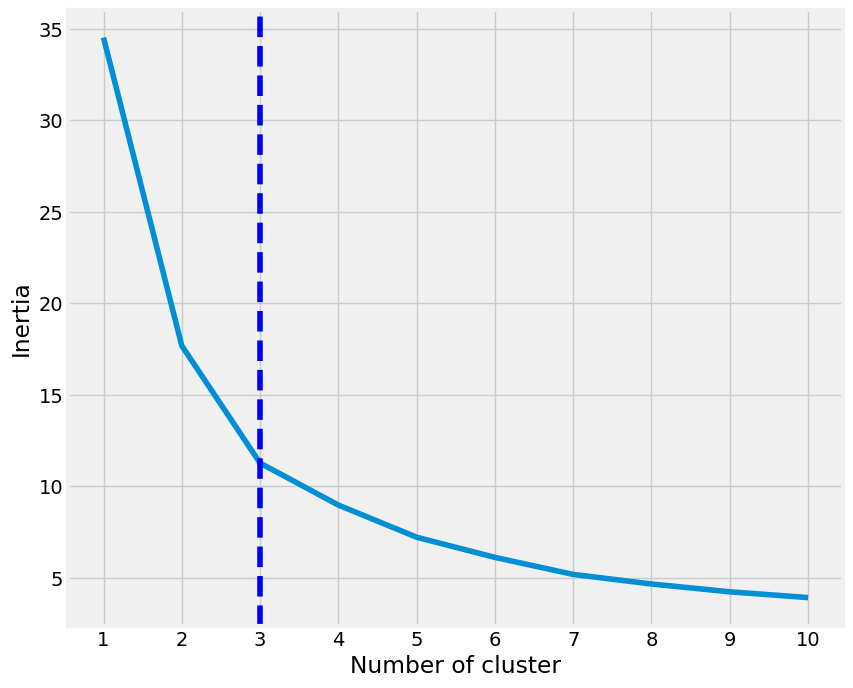

In [30]:
# find best cluster by elbow method for minmax 3 components pca
kmeans_elbow(10, pca_mmax_3)

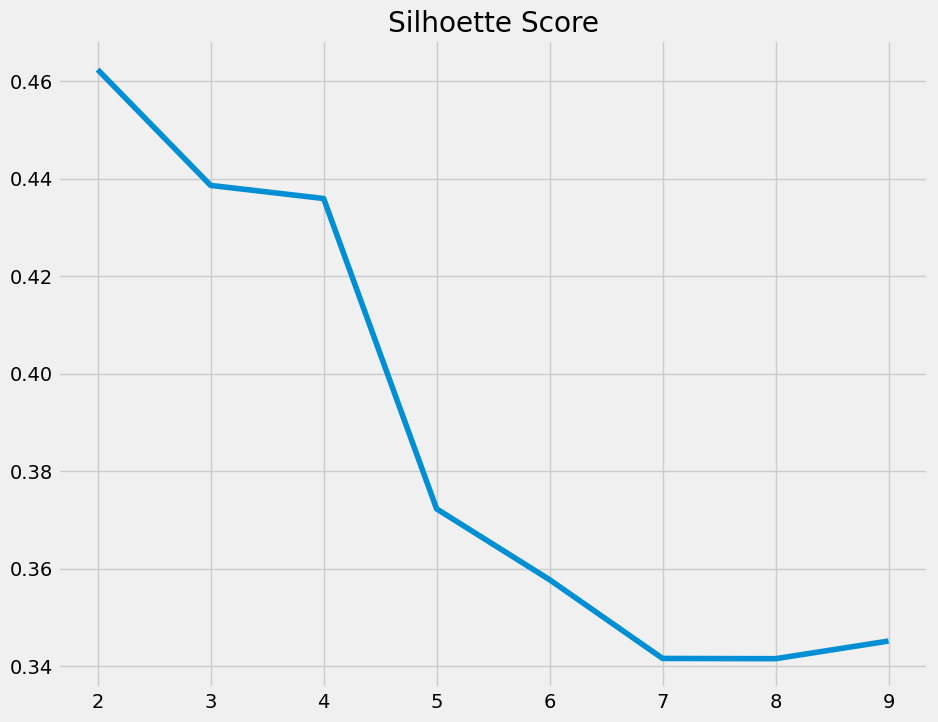

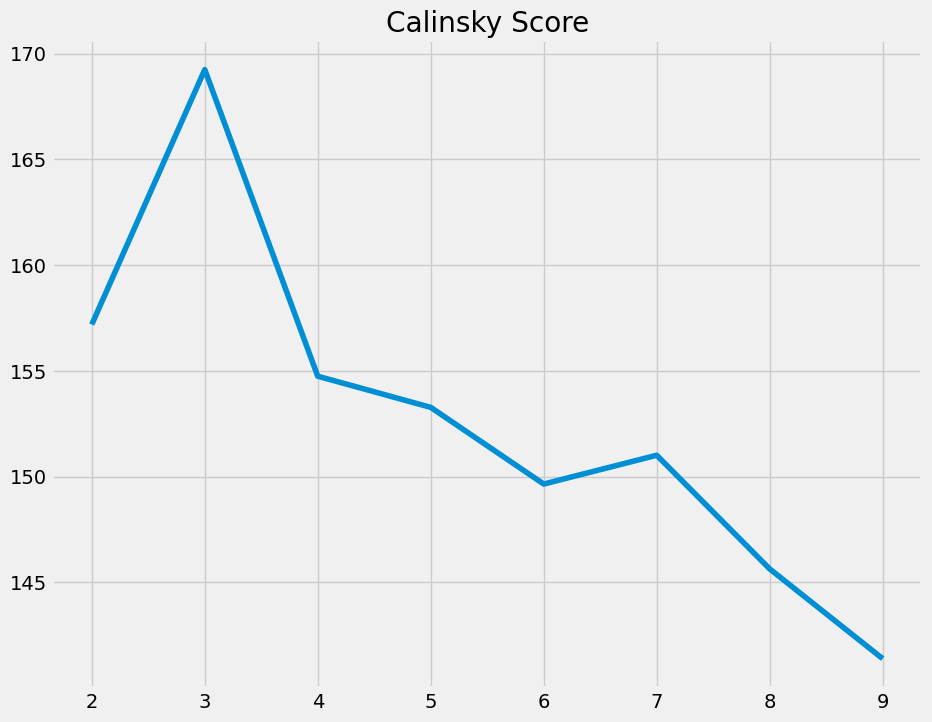

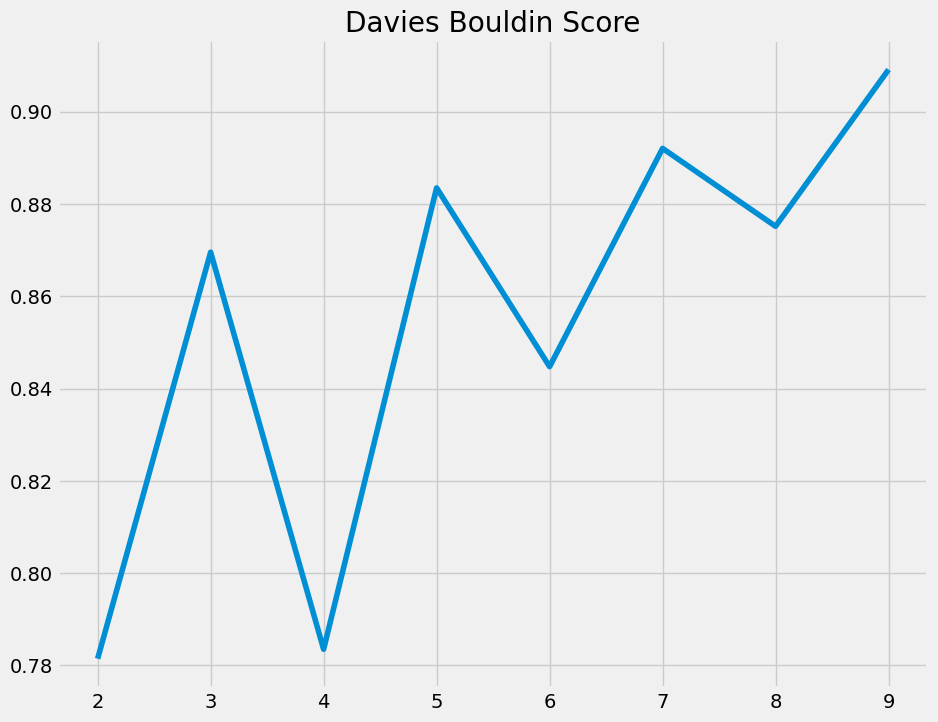

In [31]:
# find best cluster by evaluate for minmax 3 components pca
kmean_find_cluster(10, pca_mmax_3)

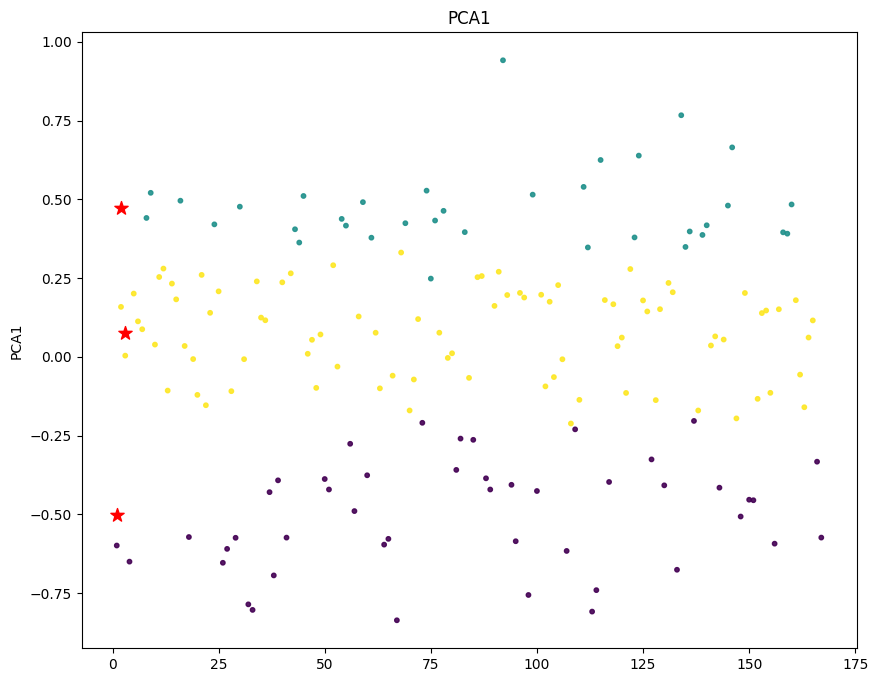

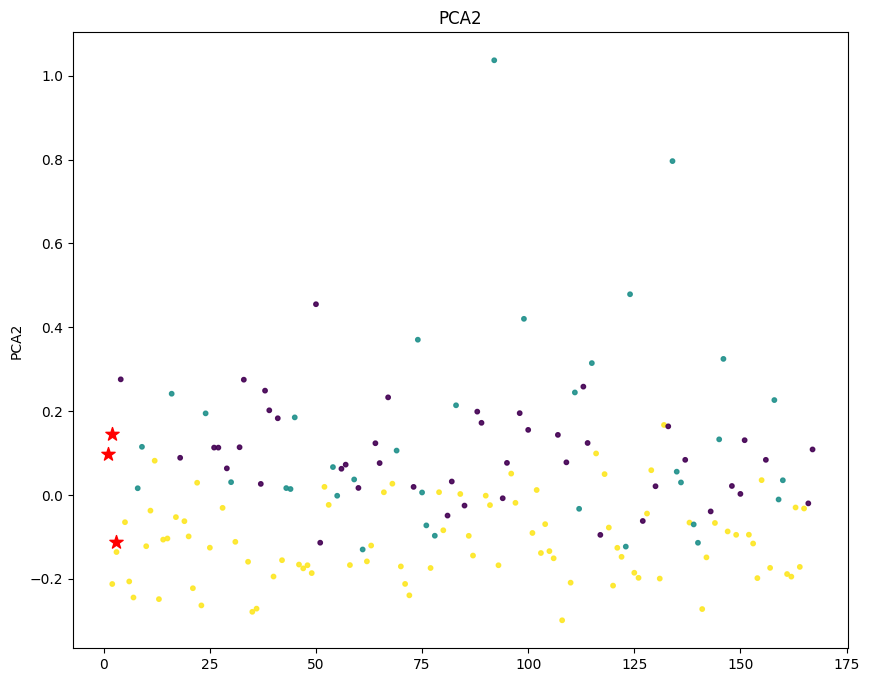

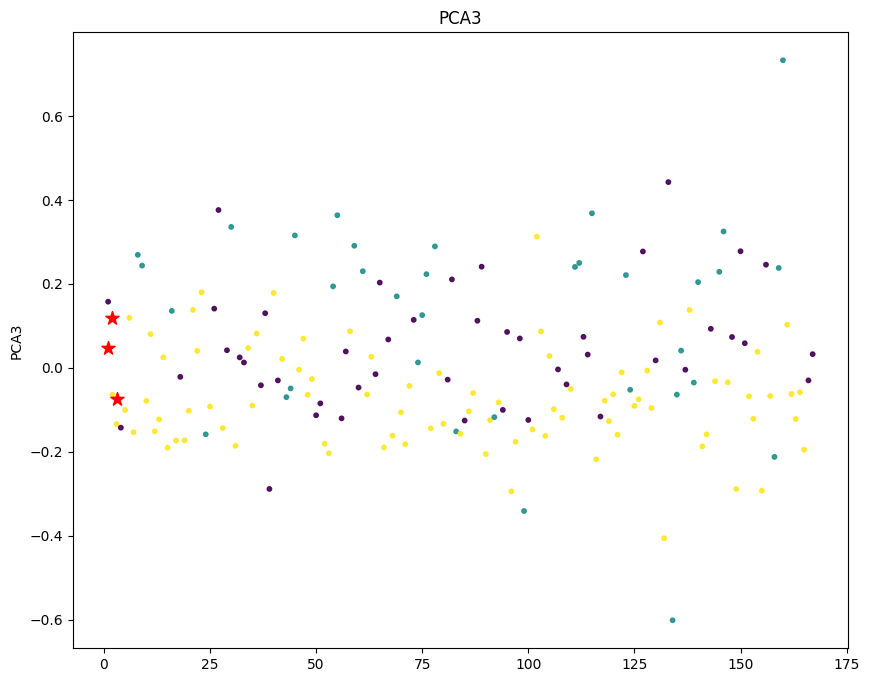

In [32]:
kmeans_label_scatterplot(3, pca_mmax_3)

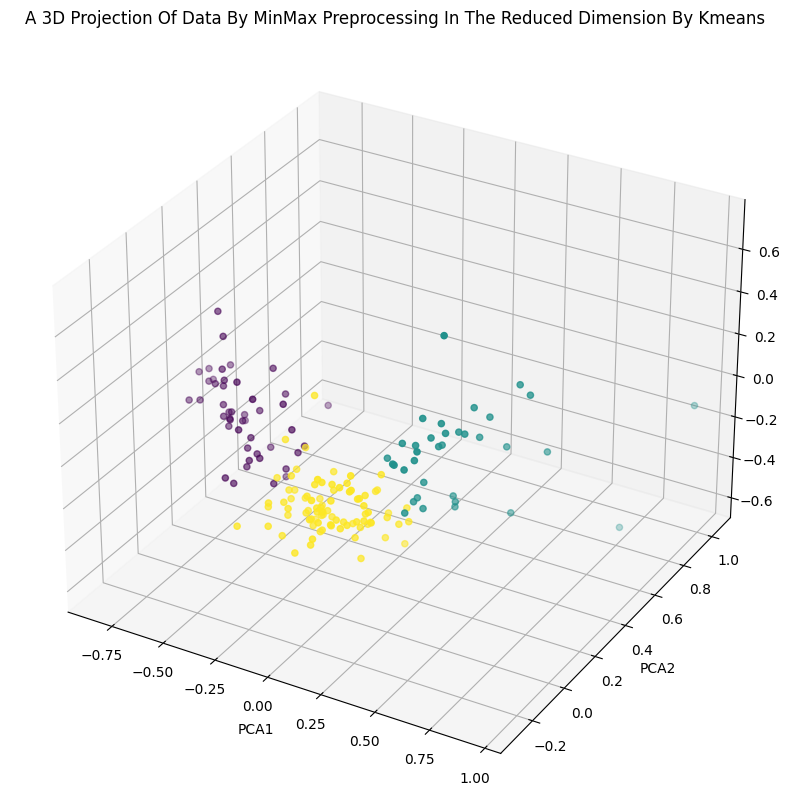

In [33]:
# visualization for pca 3 components by kmean clustering
kmean_model = KMeans(n_clusters = 3, n_init = 100, random_state = 1) # make model k means
kmean_model.fit(pca_mmax_3)
y_pred = kmean_model.fit_predict(pca_mmax_3)
#A 3D Projection Of Data In The Reduced Dimension
plt.style.use('default')
x =pca_mmax_3["PCA1"]
y =pca_mmax_3["PCA2"]
z =pca_mmax_3["PCA3"]
#To plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c=y_pred, marker="o" )
ax.set_title("A 3D Projection Of Data By MinMax Preprocessing In The Reduced Dimension By Kmeans")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.show()

# Agglo

In [34]:
# evaluate Dataframe X by agglomerative model to find best linkage and number of cluster
def agglo_find_cluster (k, X):
    
    linkage=['ward', 'complete', 'average', 'single']
    
    for lin in linkage: #make loop for linkage 
            for i in range(2,k+1): # make loop for clusters
                agglo_model = AgglomerativeClustering(linkage=lin,n_clusters=i)
                y_pred = agglo_model.fit_predict(X)
                # evaluate each models
                print("Agglomerative Clustering : clusters : ",i," linkage : ",lin," silhouette_score : ",metrics.silhouette_score(X,y_pred))
                print("Agglomerative Clustering : clusters : ",i," linkage : ",lin," Calinsky Harabas Score : ",metrics.calinski_harabasz_score(X,y_pred))
                print("Agglomerative Clustering : clusters : ",i," linkage : ",lin," David Bouldin : ",metrics.davies_bouldin_score(X,y_pred))
                print("\n======================================================================================================\n")

In [35]:
# scatterplot by linkage and number cluster on dataframe X by agglomerative model
def agglo_scatterplot(link, k, X):
    # make model by linkage and cluster number and fit on dataframe X
    agglo_model = AgglomerativeClustering(linkage=link, n_clusters=k).fit(X)
    # make a loop for scatterplot Dataframe X by agglomerative model by Purchase in base
    for i in X.columns:
        plt.figure(figsize=(10,8))
        plt.scatter(np.arange(1, 168), X[i], c=agglo_model.labels_.astype(float), s=10, alpha=0.9) # plot scatterplot by k clusters
#         plt.scatter(np.arange(1, k+1), centroids_df[i], c='red', s=100, marker='*') # plot centroids of k clusters
        plt.title("{}".format(i))
#         plt.xlabel("Purchase")
        plt.ylabel(i)
        plt.show()

In [36]:
agglo_find_cluster(10, pca_mmax_3)

Agglomerative Clustering : clusters :  2  linkage :  ward  silhouette_score :  0.4373307867335066
Agglomerative Clustering : clusters :  2  linkage :  ward  Calinsky Harabas Score :  106.89115070883906
Agglomerative Clustering : clusters :  2  linkage :  ward  David Bouldin :  0.6856235489775963


Agglomerative Clustering : clusters :  3  linkage :  ward  silhouette_score :  0.3982696676459874
Agglomerative Clustering : clusters :  3  linkage :  ward  Calinsky Harabas Score :  129.43204554897648
Agglomerative Clustering : clusters :  3  linkage :  ward  David Bouldin :  0.8591501962900455


Agglomerative Clustering : clusters :  4  linkage :  ward  silhouette_score :  0.32003831888416806
Agglomerative Clustering : clusters :  4  linkage :  ward  Calinsky Harabas Score :  133.5852023579383
Agglomerative Clustering : clusters :  4  linkage :  ward  David Bouldin :  0.9814849932151475


Agglomerative Clustering : clusters :  5  linkage :  ward  silhouette_score :  0.34977383480763236
Aggl

Agglomerative Clustering : clusters :  3  linkage :  single  silhouette_score :  0.5692421968734925
Agglomerative Clustering : clusters :  3  linkage :  single  Calinsky Harabas Score :  9.54506887889146
Agglomerative Clustering : clusters :  3  linkage :  single  David Bouldin :  0.2943383299772182


Agglomerative Clustering : clusters :  4  linkage :  single  silhouette_score :  0.38519044744315994
Agglomerative Clustering : clusters :  4  linkage :  single  Calinsky Harabas Score :  7.897107861369196
Agglomerative Clustering : clusters :  4  linkage :  single  David Bouldin :  0.36032724151781126


Agglomerative Clustering : clusters :  5  linkage :  single  silhouette_score :  0.12640815875520472
Agglomerative Clustering : clusters :  5  linkage :  single  Calinsky Harabas Score :  6.467627977536083
Agglomerative Clustering : clusters :  5  linkage :  single  David Bouldin :  0.4507695721937341


Agglomerative Clustering : clusters :  6  linkage :  single  silhouette_score :  0.070

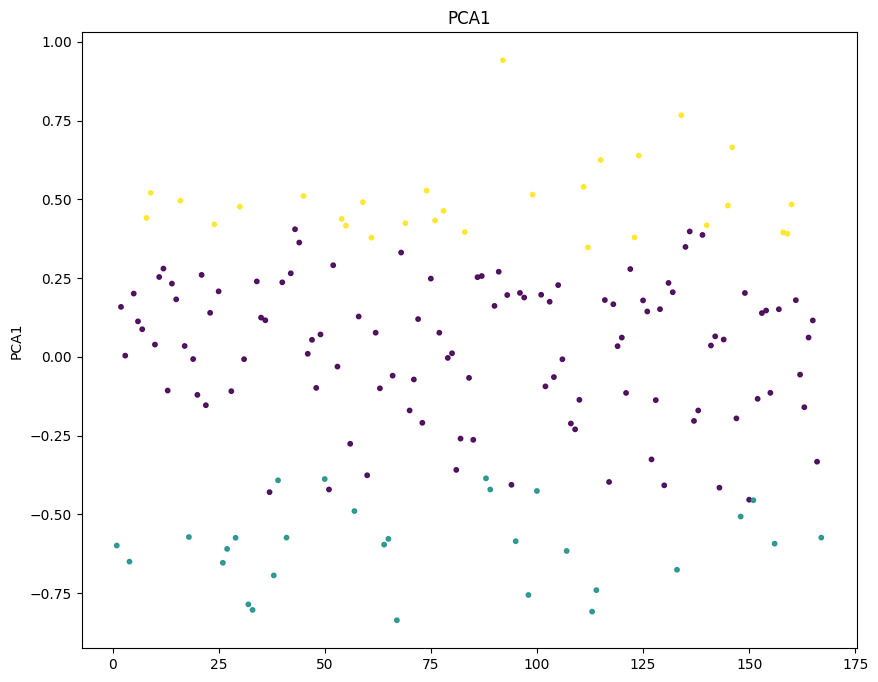

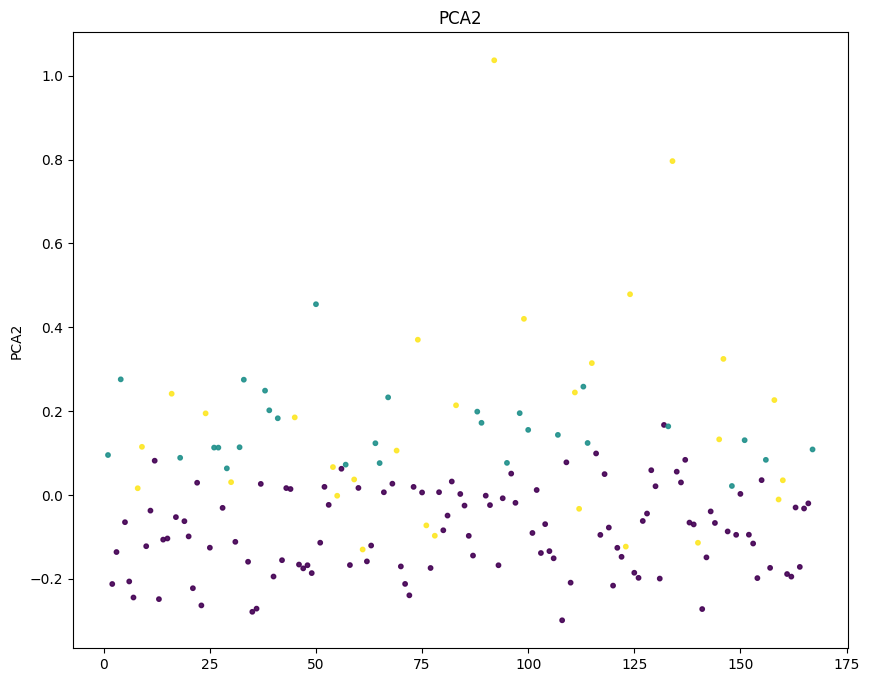

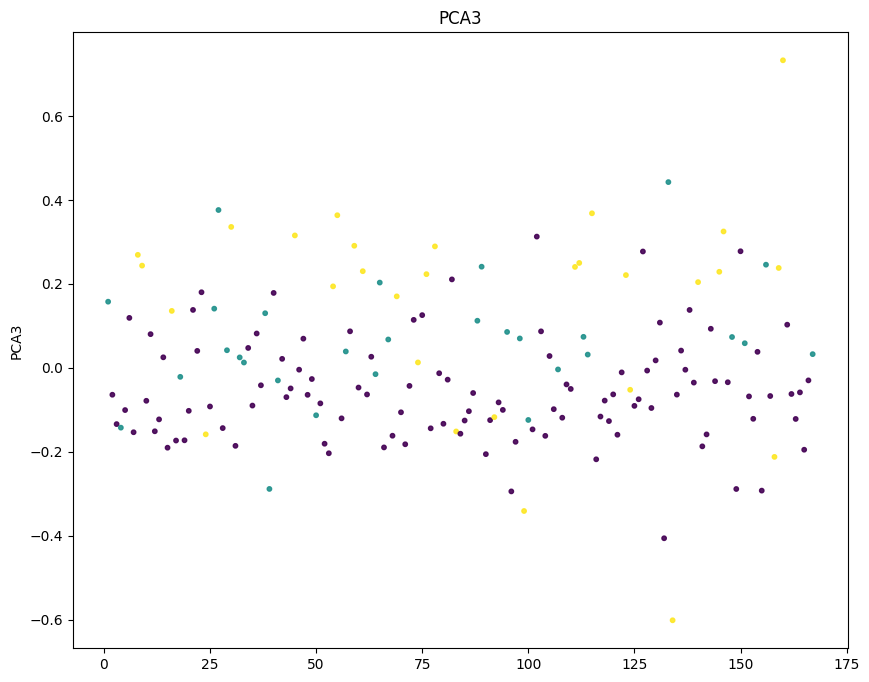

In [37]:
agglo_scatterplot('ward', 3, pca_mmax_3)

تعداد 3 کلاستر و لینکیج وارد

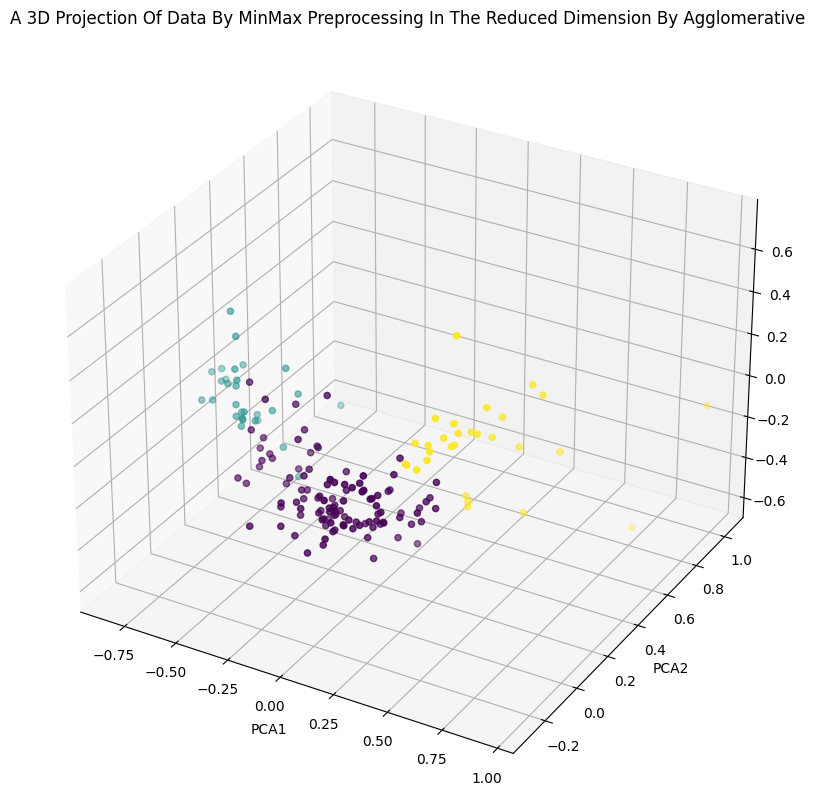

In [38]:
# visualization for pca 3 components by agglomerative clustering
agglo_model = AgglomerativeClustering(n_clusters = 3, linkage='ward') # make model
agglo_model.fit(pca_mmax_3)
y_pred_agglo = agglo_model.fit_predict(pca_mmax_3)
#A 3D Projection Of Data In The Reduced Dimension
plt.style.use('default')
x =pca_mmax_3["PCA1"]
y =pca_mmax_3["PCA2"]
z =pca_mmax_3["PCA3"]
#To plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c=y_pred_agglo, marker="o" )
ax.set_title("A 3D Projection Of Data By MinMax Preprocessing In The Reduced Dimension By Agglomerative")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.show()

# Gaussian

In [39]:
# make a def for find best n_component for dataframe X
def gaussian_find_n_component(k, X):
    silhouette = []
    calinsky = []
    db = []
    # make a loop for calculate evaluation for each component for dataframe X
    for i in range(2,k):
        GaussianMixture_model = GaussianMixture(n_components=i)
        GaussianMixture_model.fit(X)
        y_pred = GaussianMixture_model.fit_predict(X)
        # evaluate model by each component 
        silhouette_score = metrics.silhouette_score(X, y_pred)
        silhouette.append(silhouette_score)
        calinsky_score = metrics.calinski_harabasz_score(X, y_pred)
        calinsky.append(calinsky_score)
        db_score = metrics.davies_bouldin_score(X,y_pred)
        db.append(db_score)
    # plot evaluations     
    plt.figure(figsize=(10,8))
    plt.style.use('fivethirtyeight')
    plt.plot(range(2,k), silhouette)
    plt.title("Silhoette Score")
    plt.show()
    plt.figure(figsize=(10,8))
    plt.plot(range(2,k), calinsky)
    plt.title("Calinsky Score")
    plt.show()
    plt.figure(figsize=(10,8))
    plt.plot(range(2,k), db, label='Davies Bouldin')
    plt.title("Davies Bouldin Score")
    plt.show()

In [40]:
# scatterplot for gaussian model by k n_component and dataframe X
def gaussian_scatterplot(k, X):

    plt.style.use('default')
    gaussian_model = GaussianMixture(n_components=k).fit(X) # make model and fit on datafram X
    
    # scatterplot for gaussian model on dataframe X by base Purchases
    for i in X.columns:
        plt.figure(figsize=(10,8))
        plt.scatter(np.arange(1, 168), X[i], c=gaussian_model.predict(X).astype(float), s=10, alpha=0.9) # plot scatterplot by k clusters
#         plt.scatter(np.arange(1, k+1), centroids_df[i], c='red', s=100, marker='*') # plot centroids of k clusters
        plt.title("{}".format(i))
#         plt.xlabel("Purchase")
        plt.ylabel(i)
        plt.show()

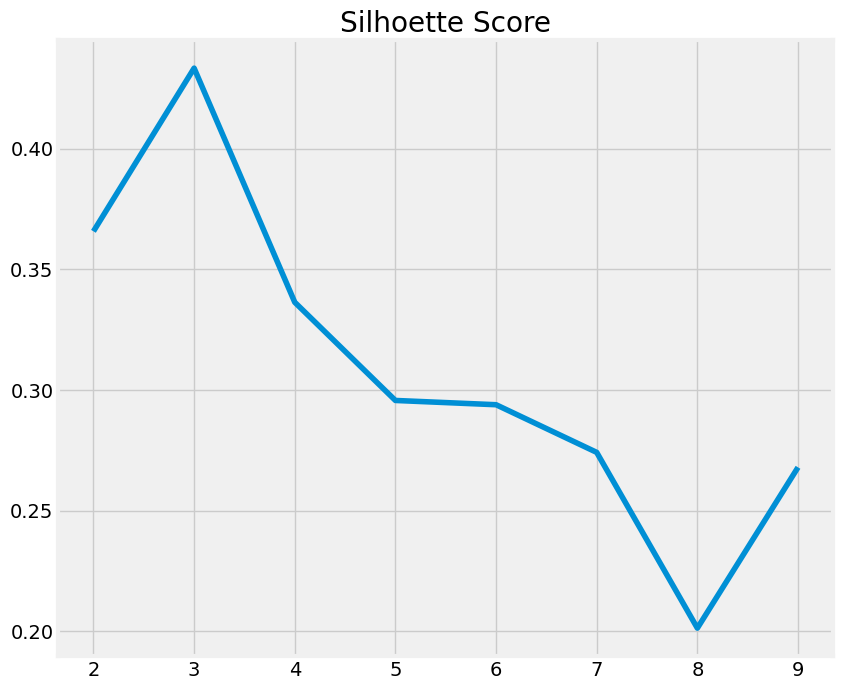

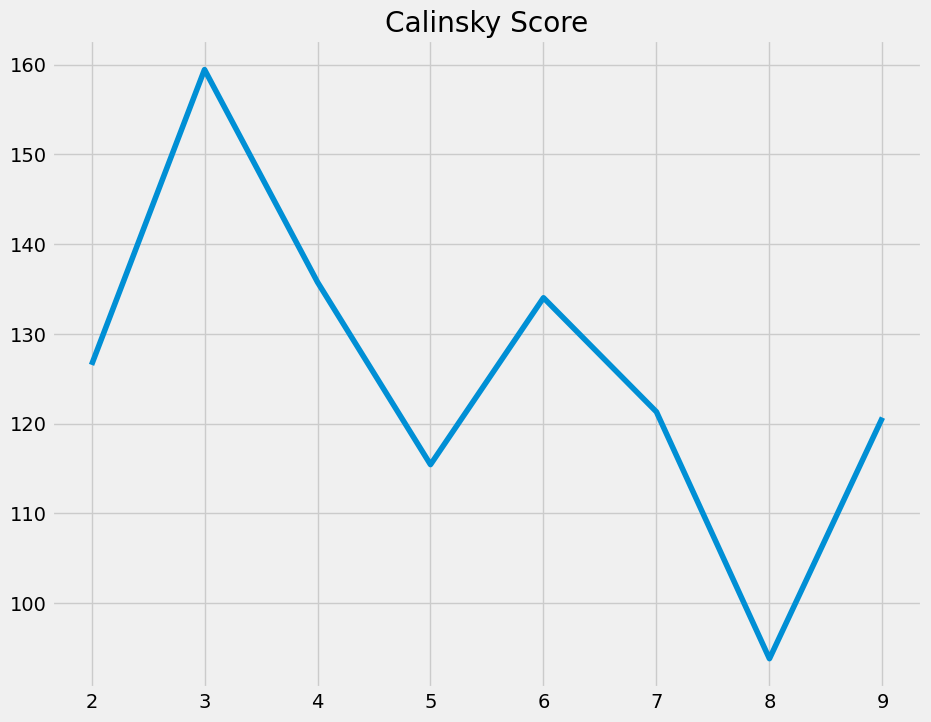

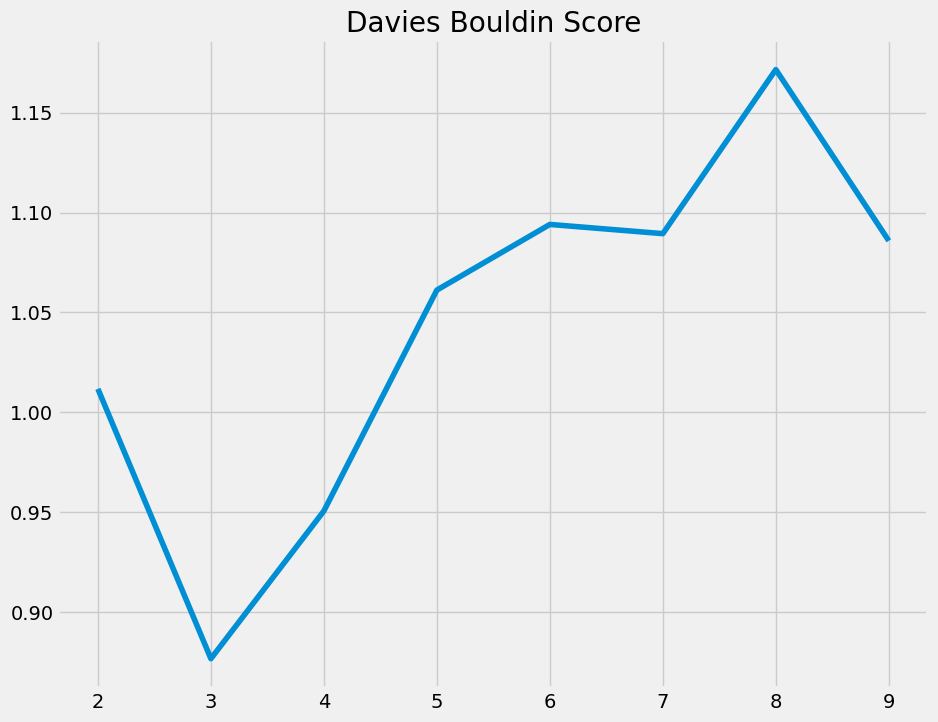

In [41]:
gaussian_find_n_component(10, pca_mmax_3)

تعذاذ 3 کلاستر بهتر است

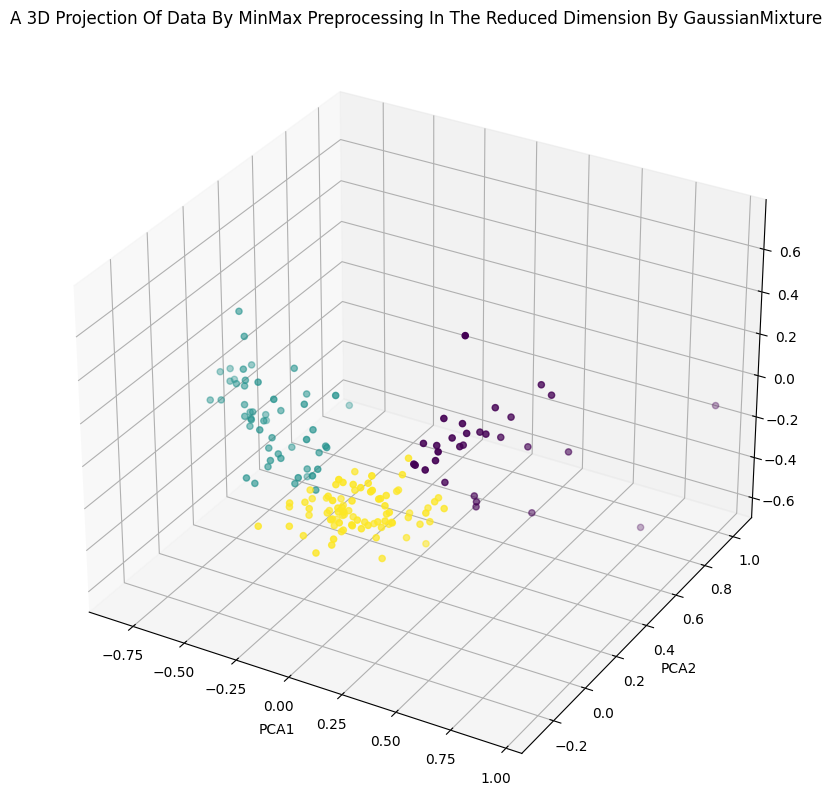

In [42]:
# visualization for pca 3 components by gaussianmixture clustering
GaussianMixture_model = GaussianMixture(n_components = 3) # make model
GaussianMixture_model.fit(pca_mmax_3)
y_pred_gauss = GaussianMixture_model.fit_predict(pca_mmax_3)
#A 3D Projection Of Data In The Reduced Dimension
plt.style.use('default')
x =pca_mmax_3["PCA1"]
y =pca_mmax_3["PCA2"]
z =pca_mmax_3["PCA3"]
#To plot
fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection="3d")
ax.scatter(x,y,z, c=y_pred_gauss, marker="o" )
ax.set_title("A 3D Projection Of Data By MinMax Preprocessing In The Reduced Dimension By GaussianMixture")
plt.xlabel("PCA1")
plt.ylabel("PCA2")
plt.show()

# Compare Models

In [43]:
# make a def for compare 3 model by evaluations for dataframe X
def Compare_models(kmeans_cluster, gaussian_componenet, agg_lin, agg_cluster, X ):
    
    kmeans = KMeans(n_clusters=kmeans_cluster, n_init = 100, random_state = 1).fit(X)# make kmeans model
    GaussianMixture_model = GaussianMixture(n_components=gaussian_componenet).fit(X)# make gaussian mixture model
    agglo_model = AgglomerativeClustering(linkage=agg_lin,n_clusters=agg_cluster).fit(X)# make agglomerative model
    # evaluate each model for compare
    print('Silhouette Score Kmeans : ', metrics.silhouette_score(X, kmeans.labels_))
    print('CH Score Kmeans : ', metrics.calinski_harabasz_score(X, kmeans.labels_))
    print('DB Score Kmeans : ', metrics.davies_bouldin_score(X, kmeans.labels_))
    print("\n==========================================================================\n")
    print('Silhouette Score Gaussian Mixture : ', metrics.silhouette_score(X, GaussianMixture_model.fit_predict(X)))
    print('CH Score Gaussian Mixture : ', metrics.calinski_harabasz_score(X, GaussianMixture_model.fit_predict(X)))
    print('DB Score Gaussian Mixture : ', metrics.davies_bouldin_score(X, GaussianMixture_model.fit_predict(X)))
    print("\n==========================================================================\n")
    print('Silhouette Score Agglomerative : ', metrics.silhouette_score(X, agglo_model.fit_predict(X)))
    print('CH Score Agglomerative : ', metrics.calinski_harabasz_score(X, agglo_model.fit_predict(X)))
    print('DB Score Agglomerative : ', metrics.davies_bouldin_score(X, agglo_model.fit_predict(X)))
    

In [44]:
Compare_models(3, 3, 'ward', 3, pca_mmax_3)

Silhouette Score Kmeans :  0.4386320345236684
CH Score Kmeans :  169.24685514616905
DB Score Kmeans :  0.8695312402635332


Silhouette Score Gaussian Mixture :  0.4333044401103335
CH Score Gaussian Mixture :  159.45629125364033
DB Score Gaussian Mixture :  0.8766049317173045


Silhouette Score Agglomerative :  0.3982696676459874
CH Score Agglomerative :  129.43204554897648
DB Score Agglomerative :  0.8591501962900455


الگوریتم کی مینز از ارزیابی بهتری برخوردار بوده

# Data Minning

In [45]:
# make a copy for final dataframe and add a cluster columns by kmeans prediction
Data_final = Data.copy()
Data_final.insert(10, "Cluster", y_pred)

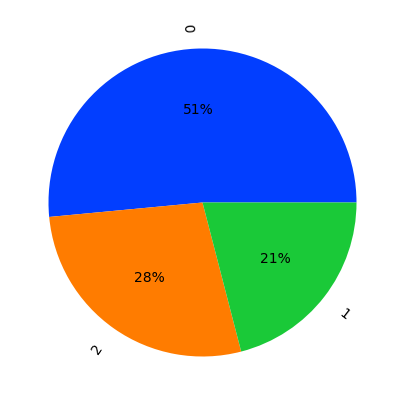

In [46]:
# percentage of each class in inlier dataframe by kmeans
data = Data_final.Cluster.value_counts()
keys = Data_final.Cluster.unique()
plt.figure(figsize=(7,5))  
# define Seaborn color palette to use
palette_color = sns.color_palette('bright')
  
# plotting data on chart
plt.pie(data, labels=keys, colors=palette_color, autopct='%.0f%%', rotatelabels=True)
  
# displaying chart
plt.show()

In [47]:
Data_final.describe()

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689,1.239521
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809,0.858758
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000,0.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000,0.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000,2.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000,2.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000,2.000000


In [48]:
# make dataframe for cluster 0
Data_final_0 = Data_final[Data_final["Cluster"] == 0]
Data_final_0.reset_index(inplace=True,drop=True)
Data_final_0

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
0,Afghanistan,90.2,10.00,7.58,44.9,1610,9.440,56.2,5.82,553,0
1,Angola,119.0,62.30,2.85,42.9,5900,22.400,60.1,6.16,3530,0
2,Benin,111.0,23.80,4.10,37.2,1820,0.885,61.8,5.36,758,0
3,Burkina Faso,116.0,19.20,6.74,29.6,1430,6.810,57.9,5.87,575,0
4,Burundi,93.6,8.92,11.60,39.2,764,12.300,57.7,6.26,231,0
5,Cameroon,108.0,22.20,5.13,27.0,2660,1.910,57.3,5.11,1310,0
6,Central African Republic,149.0,11.80,3.98,26.5,888,2.010,47.5,5.21,446,0
7,Chad,150.0,36.80,4.53,43.5,1930,6.390,56.5,6.59,897,0
8,Comoros,88.2,16.50,4.51,51.7,1410,3.870,65.9,4.75,769,0
9,"Congo, Dem. Rep.",116.0,41.10,7.91,49.6,609,20.800,57.5,6.54,334,0


In [49]:
# make dataframe for cluster 1
Data_final_1 = Data_final[Data_final["Cluster"] == 1]
Data_final_1.reset_index(inplace=True,drop=True)
Data_final_1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
0,Australia,4.8,19.8,8.73,20.9,41400,1.160,82.0,1.93,51900,1
1,Austria,4.3,51.3,11.00,47.8,43200,0.873,80.5,1.44,46900,1
2,Belgium,4.5,76.4,10.70,74.7,41100,1.880,80.0,1.86,44400,1
3,Brunei,10.5,67.4,2.84,28.0,80600,16.700,77.1,1.84,35300,1
4,Canada,5.6,29.1,11.30,31.0,40700,2.870,81.3,1.63,47400,1
5,Cyprus,3.6,50.2,5.97,57.5,33900,2.010,79.9,1.42,30800,1
6,Czech Republic,3.4,66.0,7.88,62.9,28300,-1.430,77.5,1.51,19800,1
7,Denmark,4.1,50.5,11.40,43.6,44000,3.220,79.5,1.87,58000,1
8,Finland,3.0,38.7,8.95,37.4,39800,0.351,80.0,1.87,46200,1
9,France,4.2,26.8,11.90,28.1,36900,1.050,81.4,2.03,40600,1


In [50]:
# make dataframe for cluster 2
Data_final_2 = Data_final[Data_final["Cluster"] == 2]
Data_final_2.reset_index(inplace=True,drop=True)
Data_final_2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,Cluster
0,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
1,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
2,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
3,Argentina,14.5,18.9,8.10,16.0,18700,20.90,75.8,2.37,10300,2
4,Armenia,18.1,20.8,4.40,45.3,6700,7.77,73.3,1.69,3220,2
...,...,...,...,...,...,...,...,...,...,...,...
81,Uruguay,10.6,26.3,8.35,25.4,17100,4.91,76.4,2.08,11900,2
82,Uzbekistan,36.3,31.7,5.81,28.5,4240,16.50,68.8,2.34,1380,2
83,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2
84,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2


In [51]:
Data_final_0.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,46.0,93.284783,34.079410,28.100,64.625,90.250,111.0000,208.00
exports,46.0,29.287174,18.479530,2.200,16.875,23.800,38.8000,85.80
health,46.0,6.338478,2.668183,2.200,4.515,5.480,7.8450,13.10
imports,46.0,43.297826,18.636362,17.200,30.225,41.500,49.5250,101.00
income,46.0,3516.804348,5391.402727,609.000,1390.000,1835.000,3310.0000,33700.00
inflation,46.0,12.097065,15.670791,0.885,3.940,8.995,16.6000,104.00
life_expec,46.0,59.393478,6.473859,32.100,56.925,60.250,62.8750,71.10
total_fer,46.0,5.090217,0.940327,3.150,4.570,5.085,5.6725,7.49
gdpp,46.0,1695.913043,2795.655748,231.000,548.500,833.000,1310.0000,17100.00
Cluster,46.0,0.000000,0.000000,0.000,0.000,0.000,0.0000,0.00


In [52]:
Data_final_1.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,35.0,4.897143,2.130795,2.60,3.500,4.20,5.40,10.80
exports,35.0,58.431429,42.501749,12.40,29.500,50.20,67.05,200.00
health,35.0,8.917429,3.154562,1.81,7.825,9.48,10.85,17.90
imports,35.0,51.508571,37.381754,13.60,28.300,37.40,62.90,174.00
income,35.0,45802.857143,21141.490928,25200.00,32400.000,40400.00,47550.00,125000.00
inflation,35.0,2.535000,4.053256,-3.22,0.418,1.16,3.42,16.70
life_expec,35.0,80.245714,1.696596,75.50,79.650,80.40,81.40,82.80
total_fer,35.0,1.741143,0.371814,1.15,1.435,1.79,1.94,3.03
gdpp,35.0,43117.142857,18891.773587,16600.00,30750.000,41800.00,48550.00,105000.00
Cluster,35.0,1.000000,0.000000,1.00,1.000,1.00,1.00,1.00


In [53]:
Data_final_2.describe().T

,count,mean,std,min,25%,50%,75%,max
child_mort,86.0,22.425581,14.459934,4.5000,11.5500,18.350,29.1750,64.40
exports,86.0,40.382430,19.089329,0.1090,26.9000,37.300,51.4000,93.80
health,86.0,6.215581,2.163140,1.9700,4.8725,5.930,7.4275,14.20
imports,86.0,46.932162,19.647602,0.0659,31.6500,48.650,60.0250,108.00
income,86.0,12770.813953,8578.103618,1990.0000,6715.0000,10700.000,16950.0000,45400.00
inflation,86.0,7.609023,7.758666,-4.2100,2.4325,5.935,9.9525,45.90
life_expec,86.0,72.582558,4.568156,54.3000,70.0000,73.600,76.0750,80.40
total_fer,86.0,2.293256,0.659719,1.2500,1.7625,2.235,2.6575,4.34
gdpp,86.0,6719.790698,5160.729689,592.0000,2975.0000,5050.000,9070.0000,28000.00
Cluster,86.0,2.000000,0.000000,2.0000,2.0000,2.000,2.0000,2.00


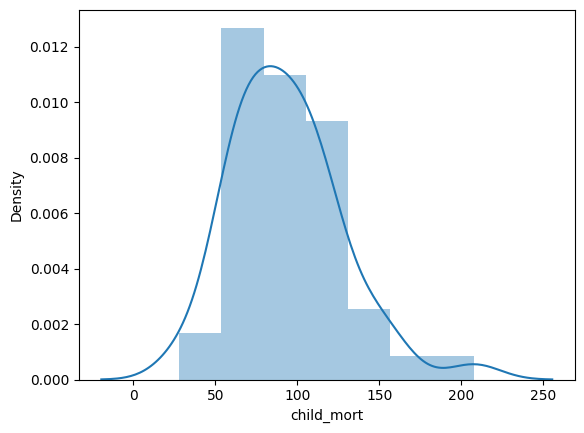

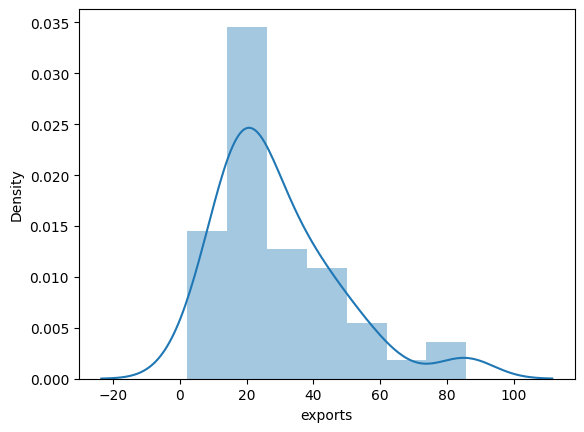

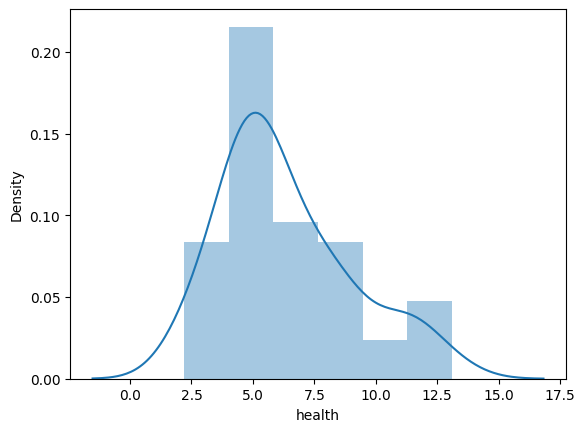

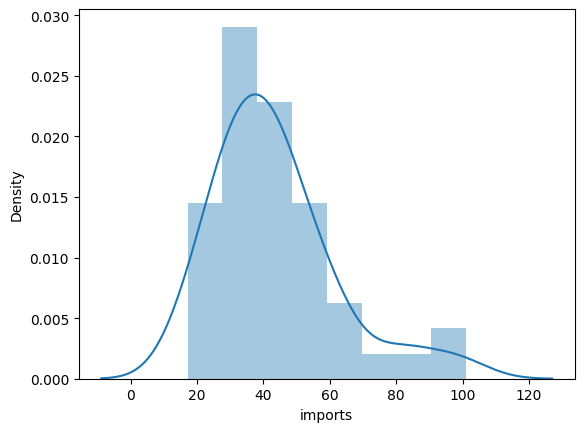

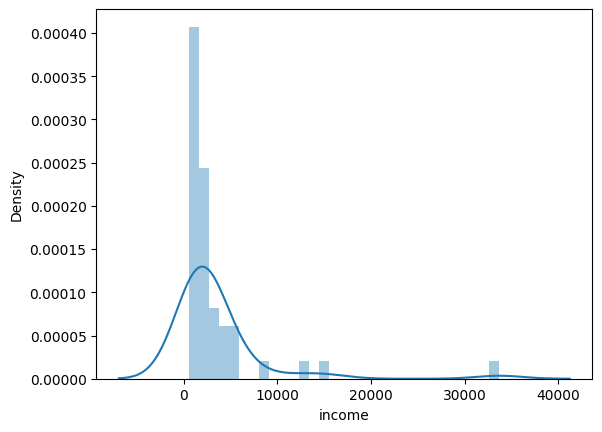

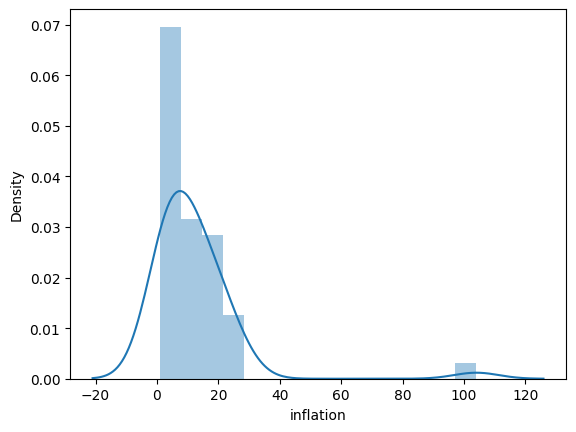

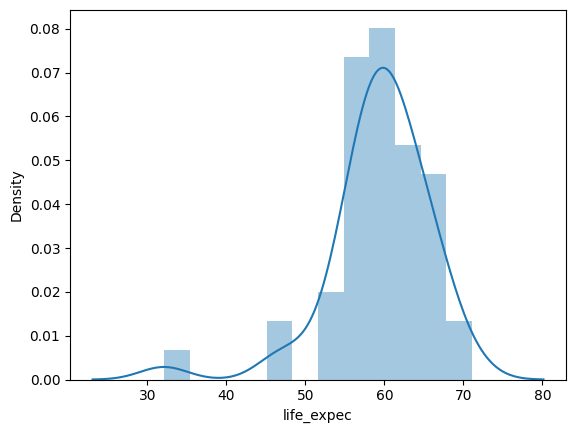

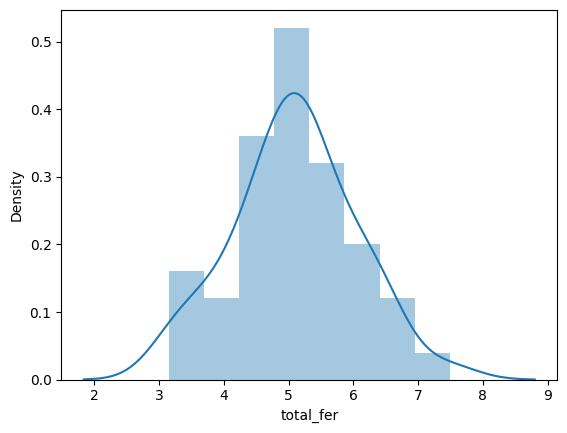

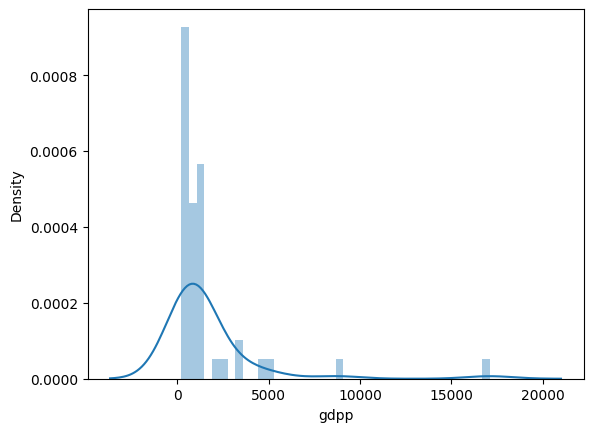

In [54]:
# make plot for distribution of each columns in cluster 0
column=['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']

for i in column :
    sns.distplot(Data_final_0[i])
    plt.show()

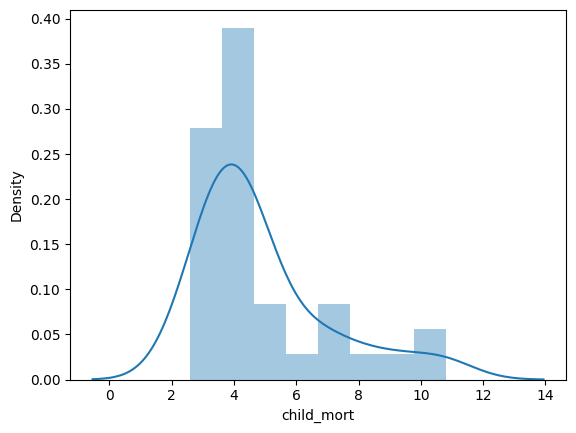

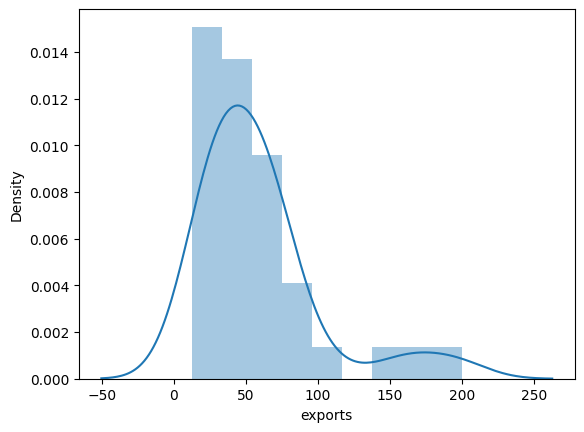

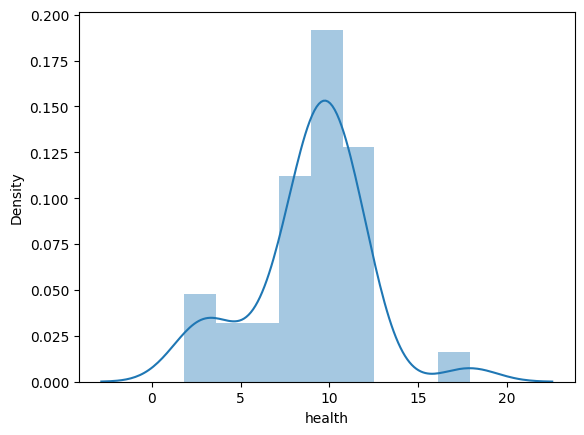

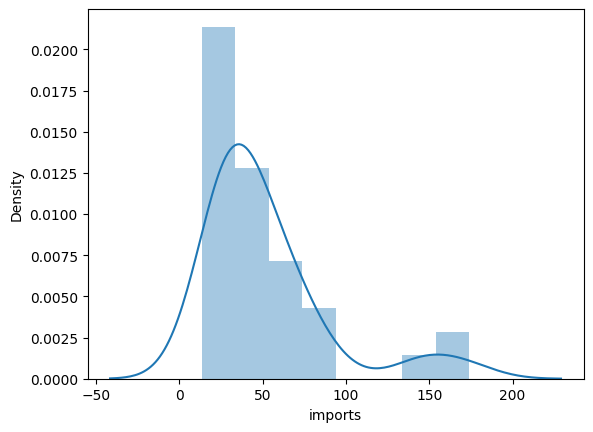

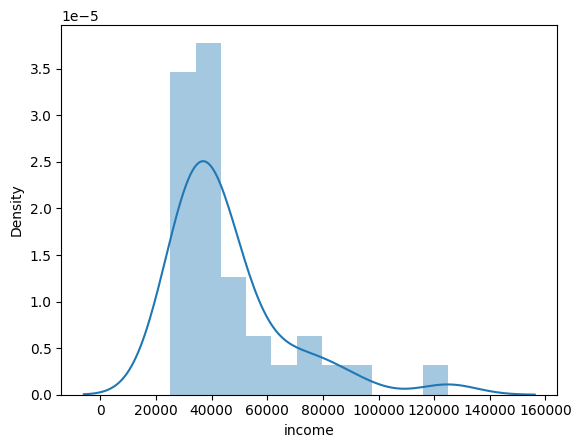

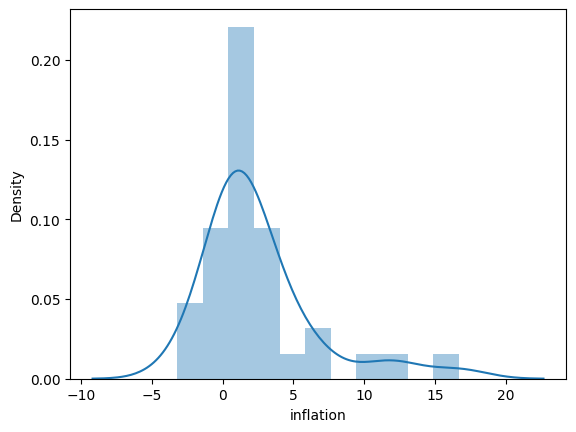

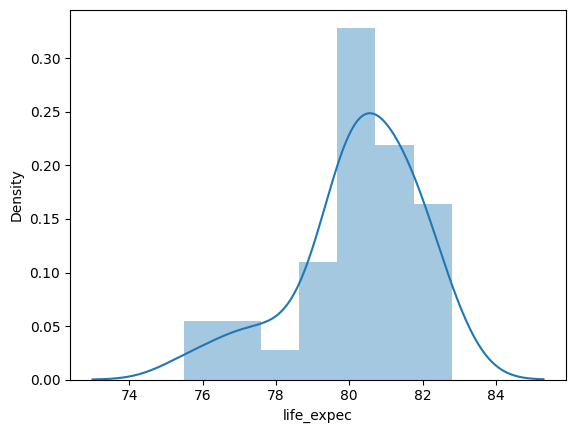

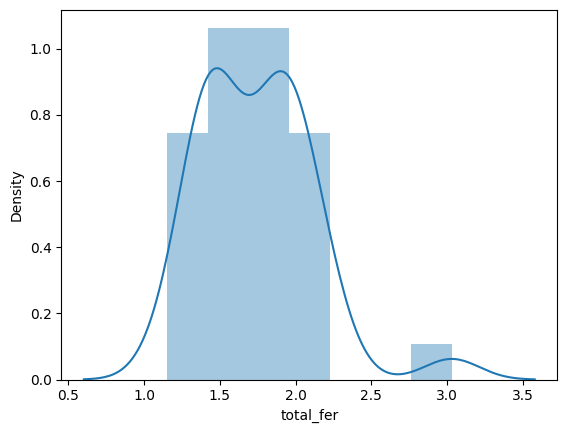

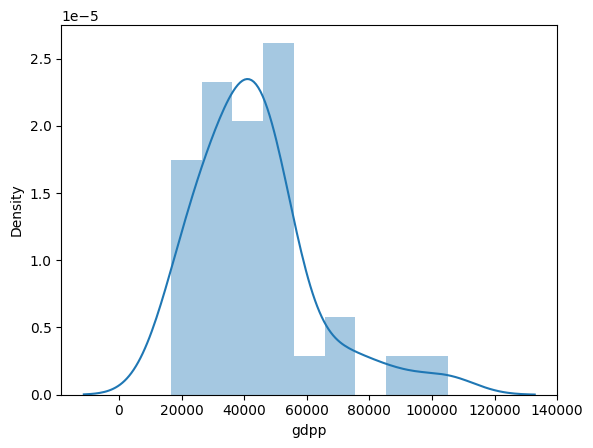

In [55]:
# make plot for distribution of each columns in cluster 1
column=['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']

for i in column :
    sns.distplot(Data_final_1[i])
    plt.show()

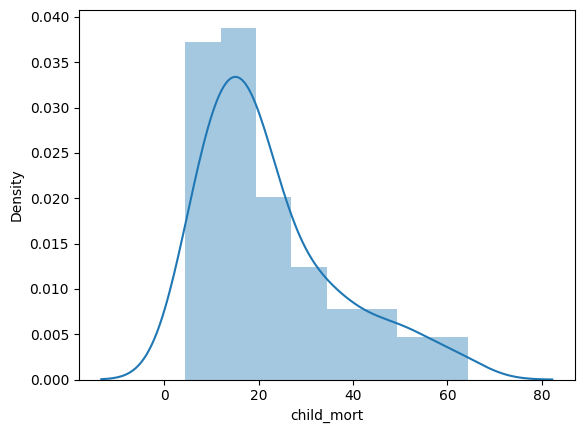

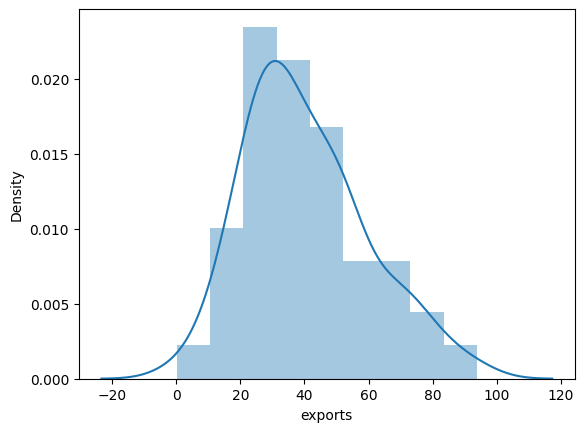

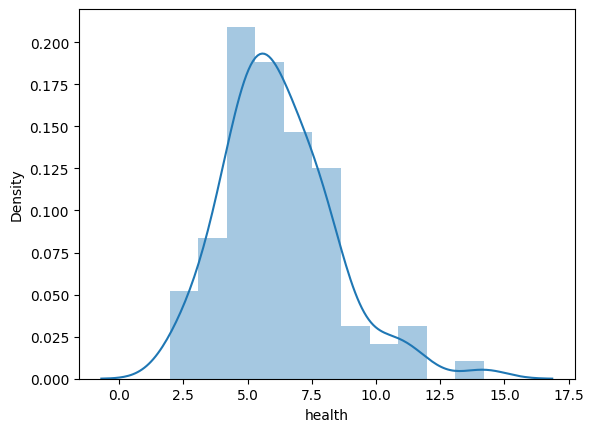

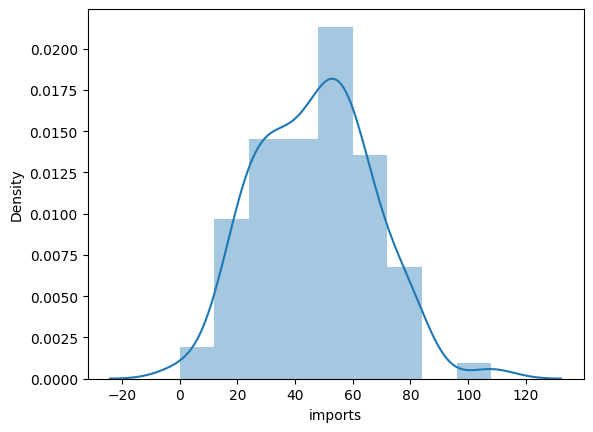

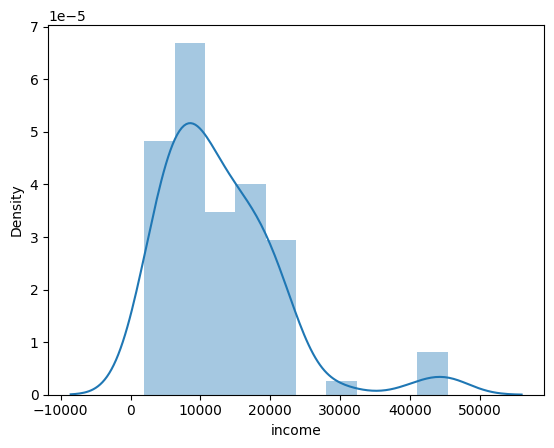

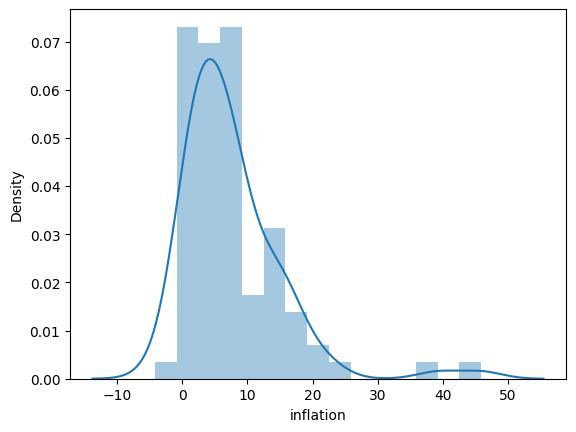

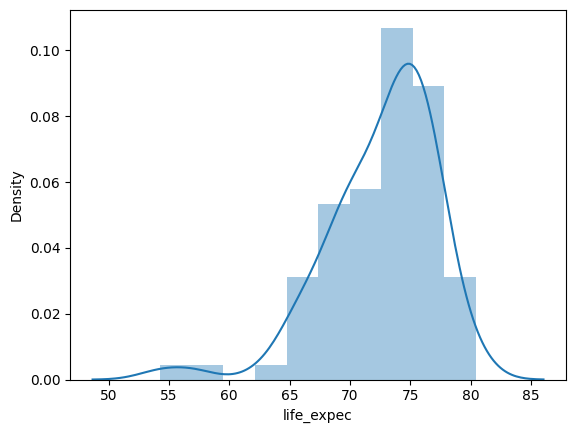

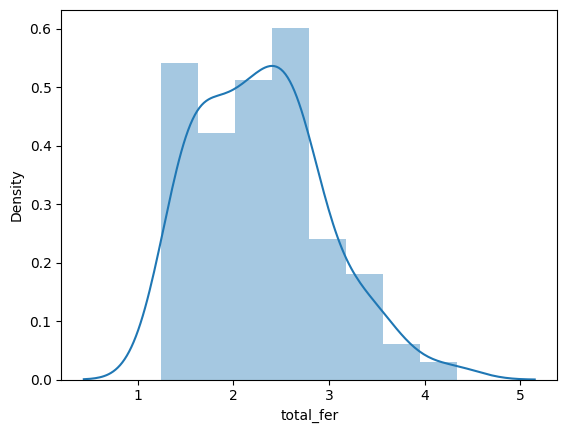

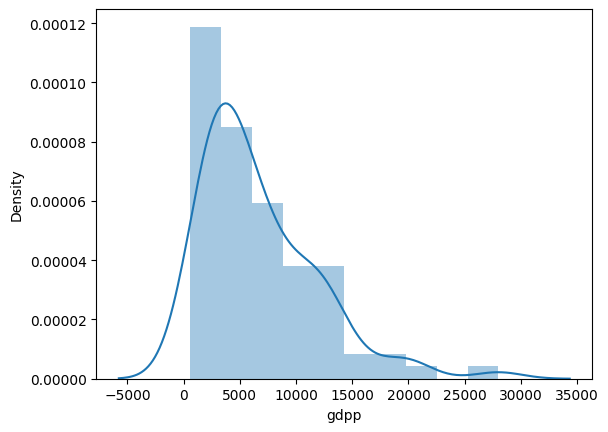

In [56]:
# make plot for distribution of each columns in cluster 2
column=['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']

for i in column :
    sns.distplot(Data_final_2[i])
    plt.show()

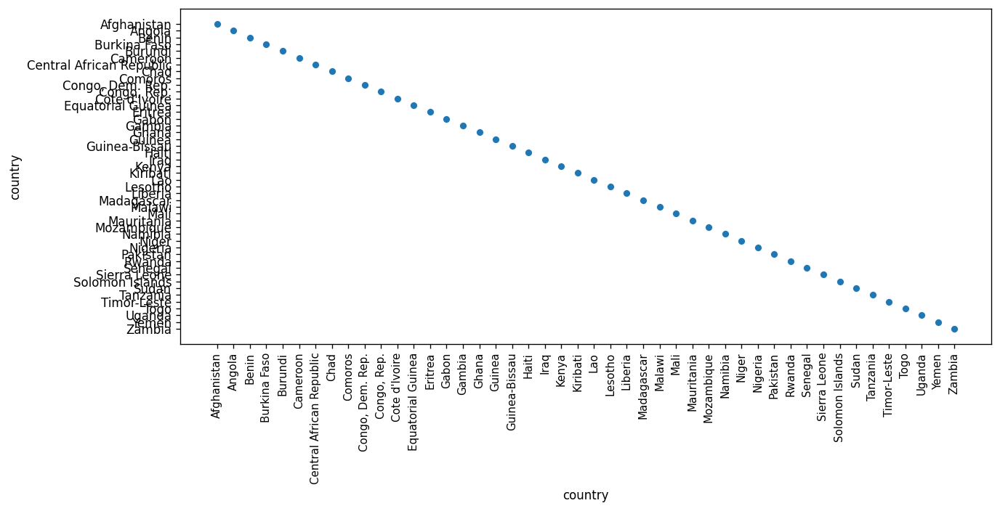

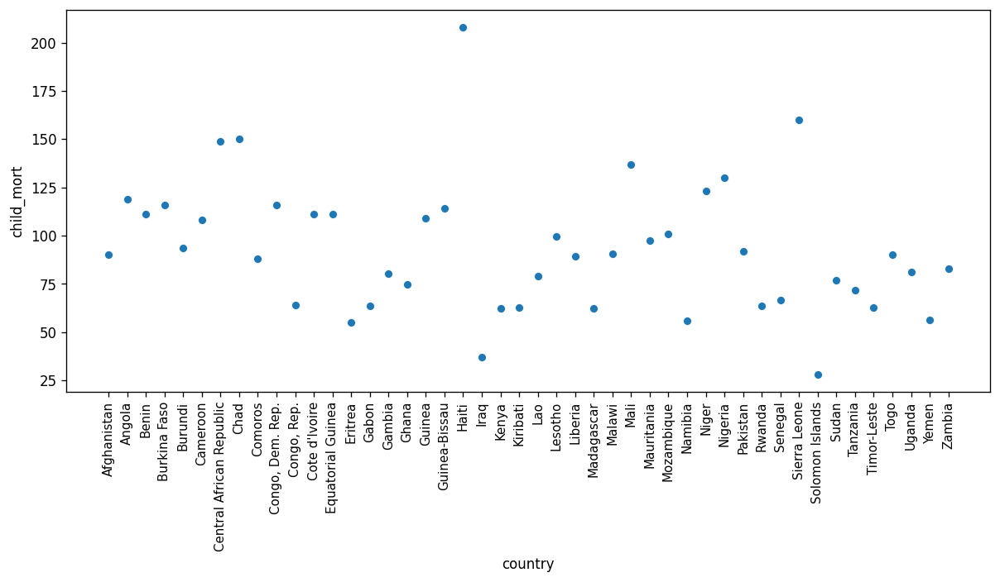

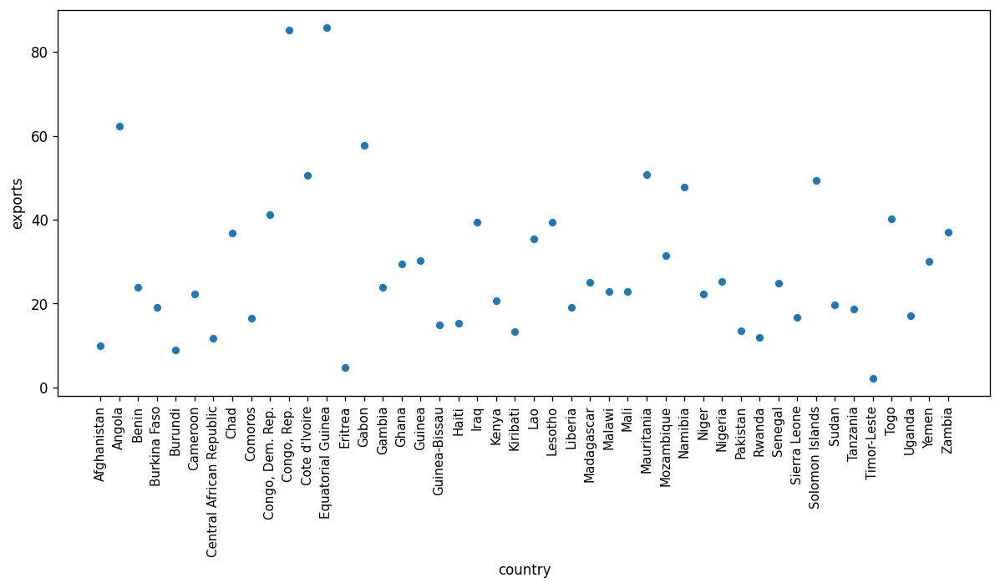

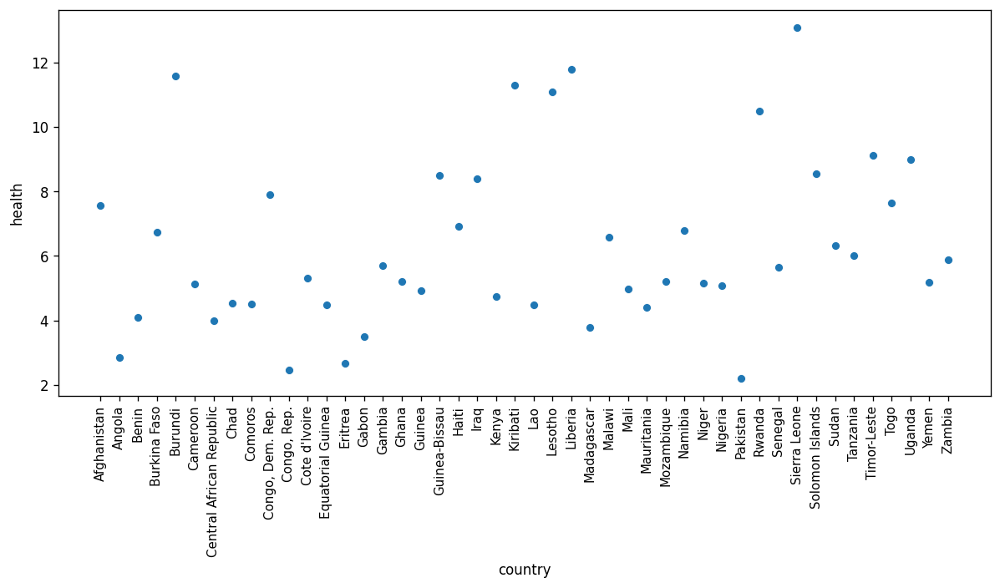

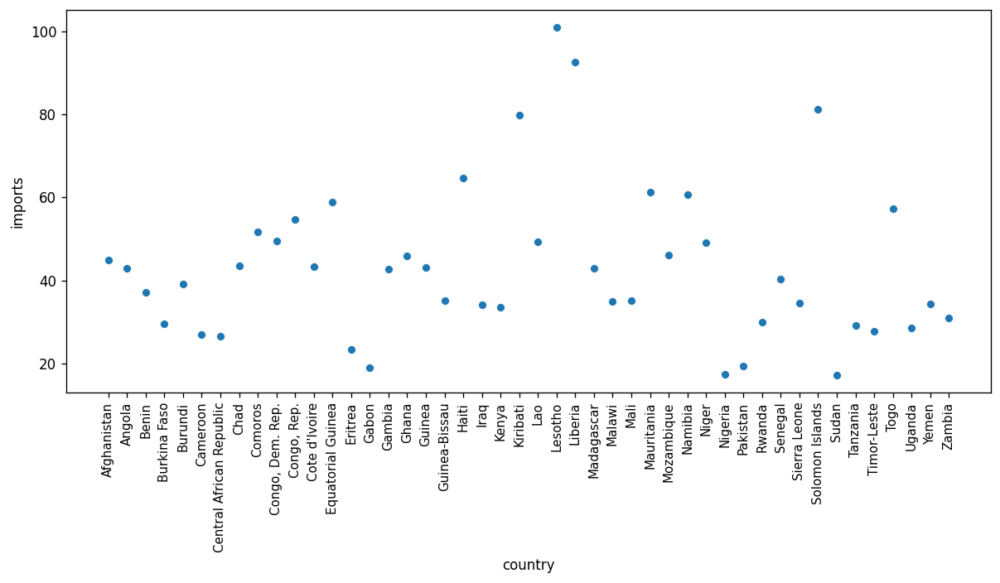

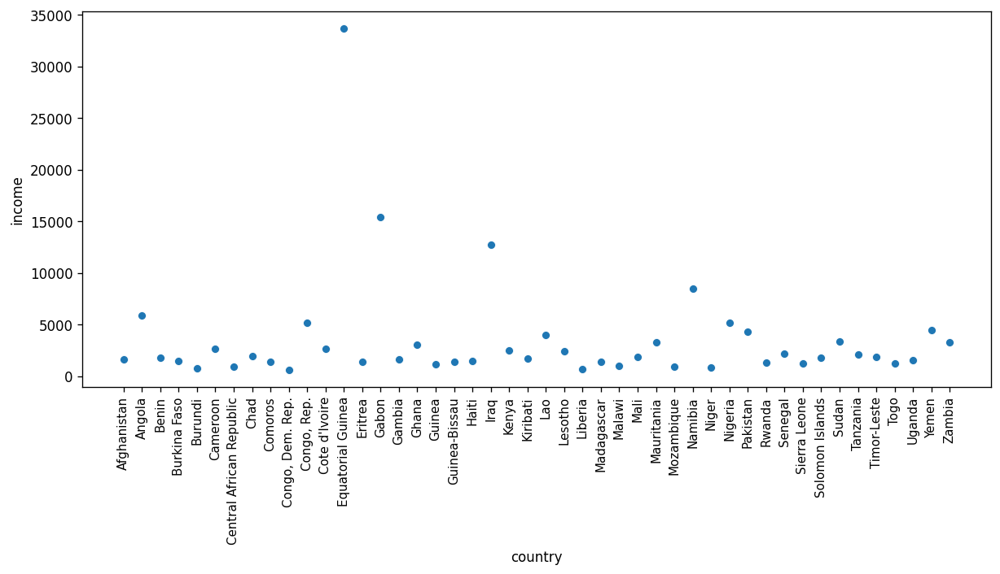

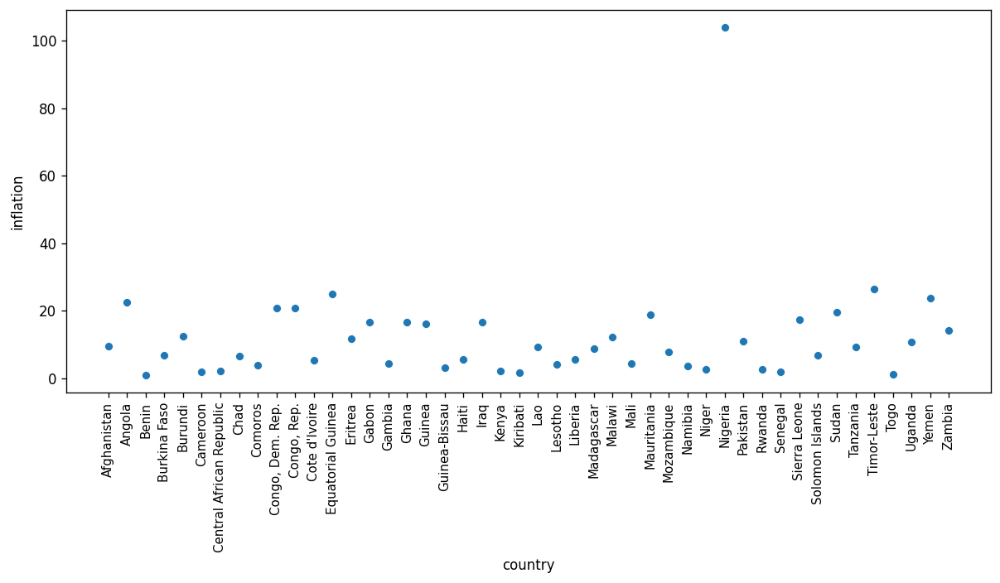

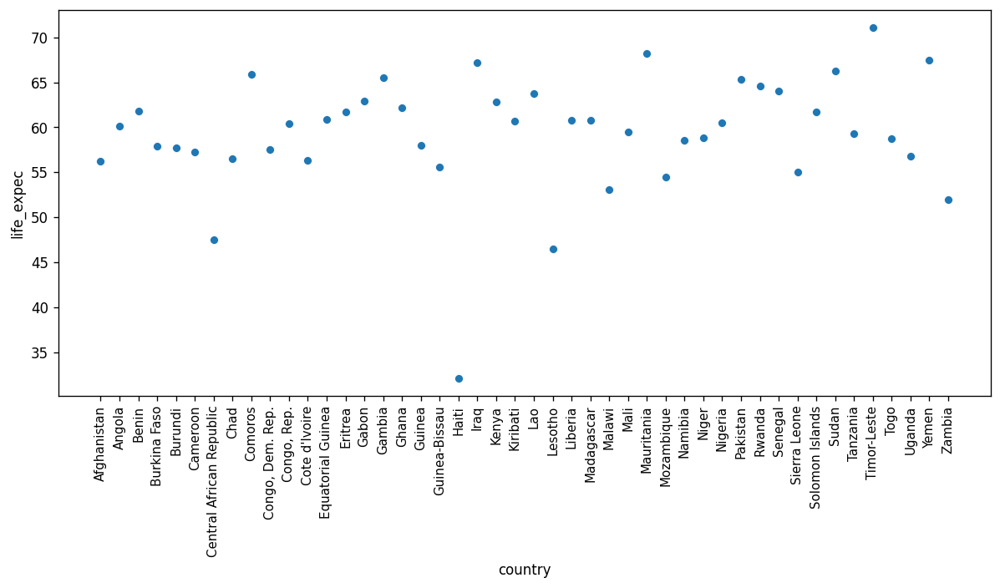

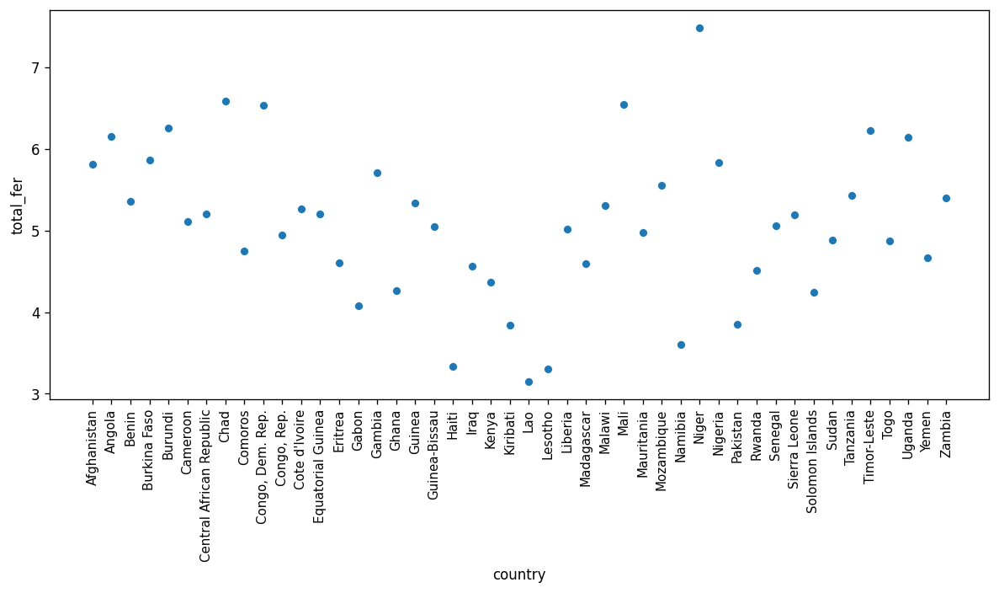

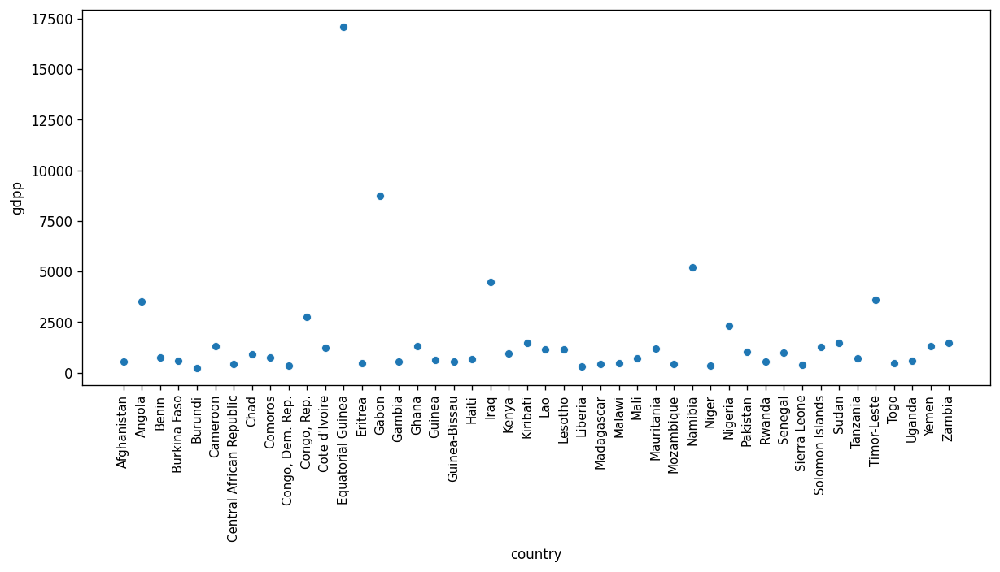

In [57]:
# scatter plot for each columns base on country 
i = 0
while i < len(Data_final_0.columns):
    
        fig = plt.figure(figsize = (12, 5), dpi = 120)
        sns.scatterplot(x = Data_final_0.country, y= Data_final_0.columns[i], data = Data_final_0)
        plt.xticks(rotation=90, fontsize=9)
        i += 1
        if i == 10 :
            break
    
plt.show()

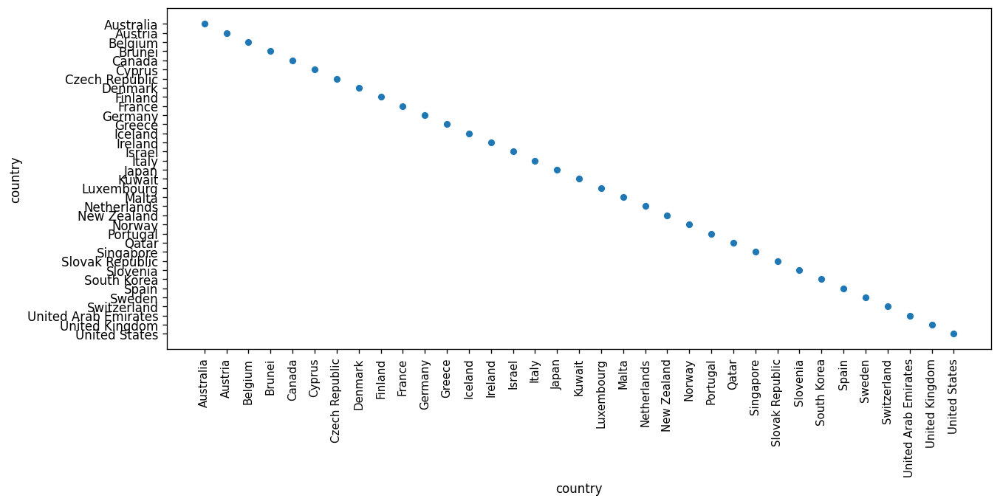

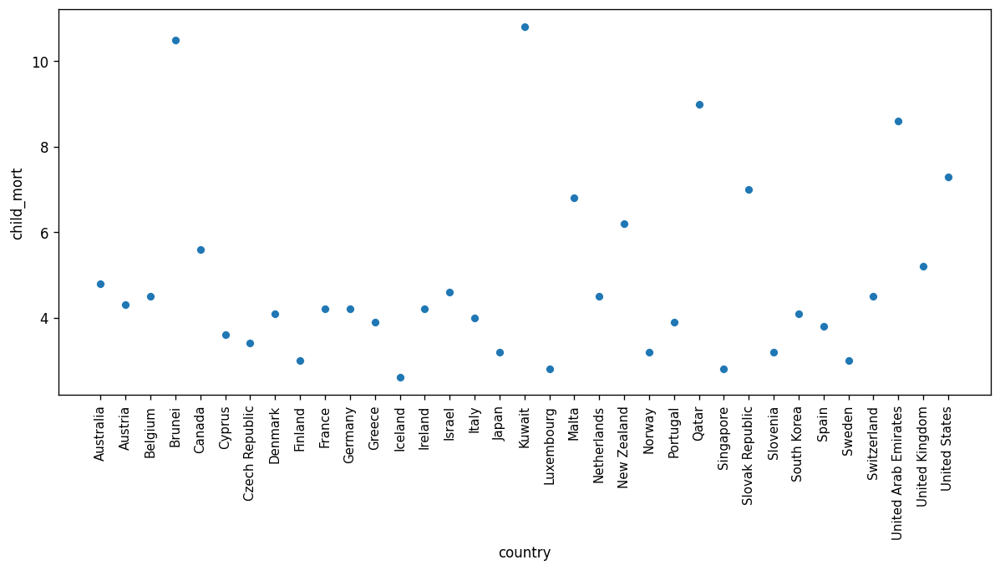

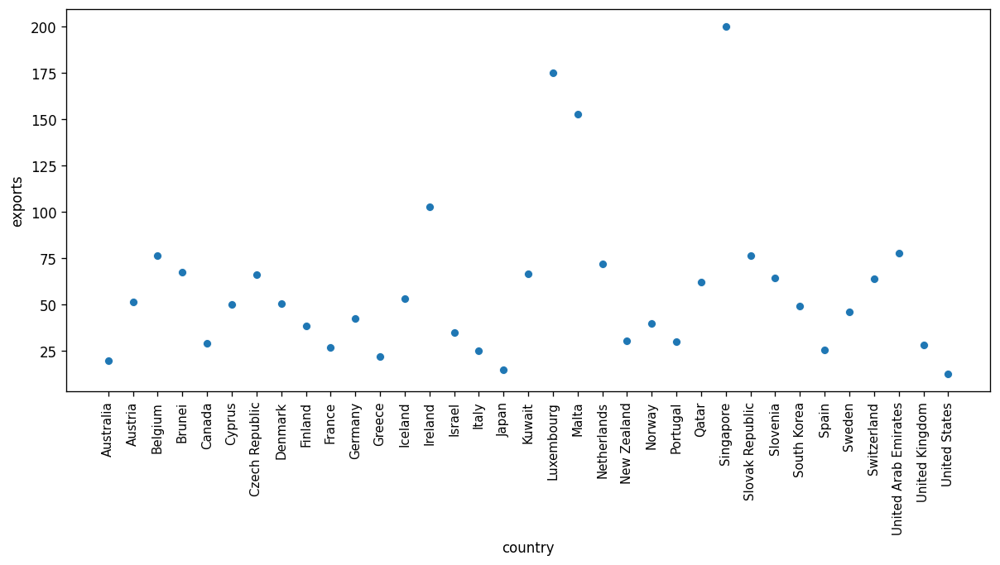

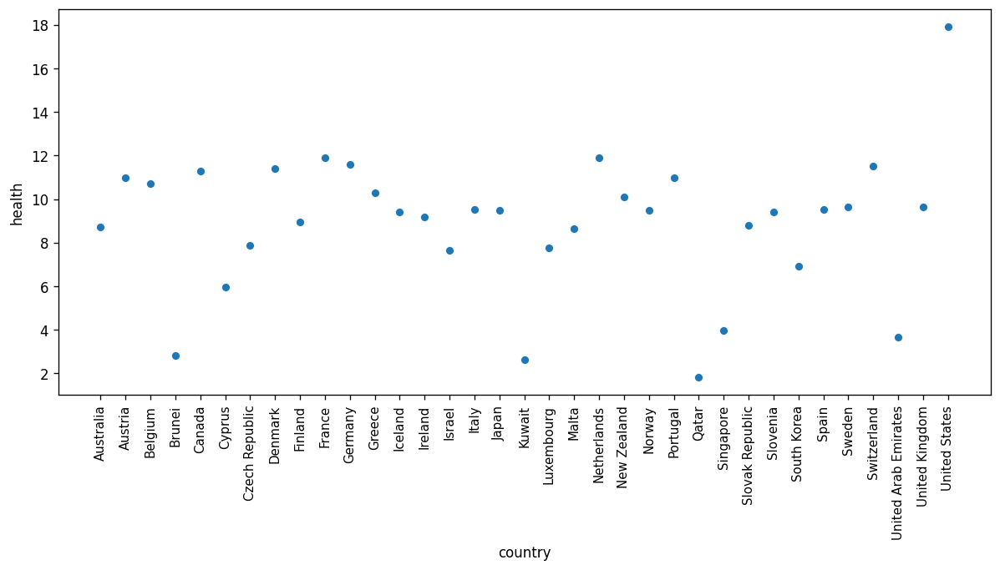

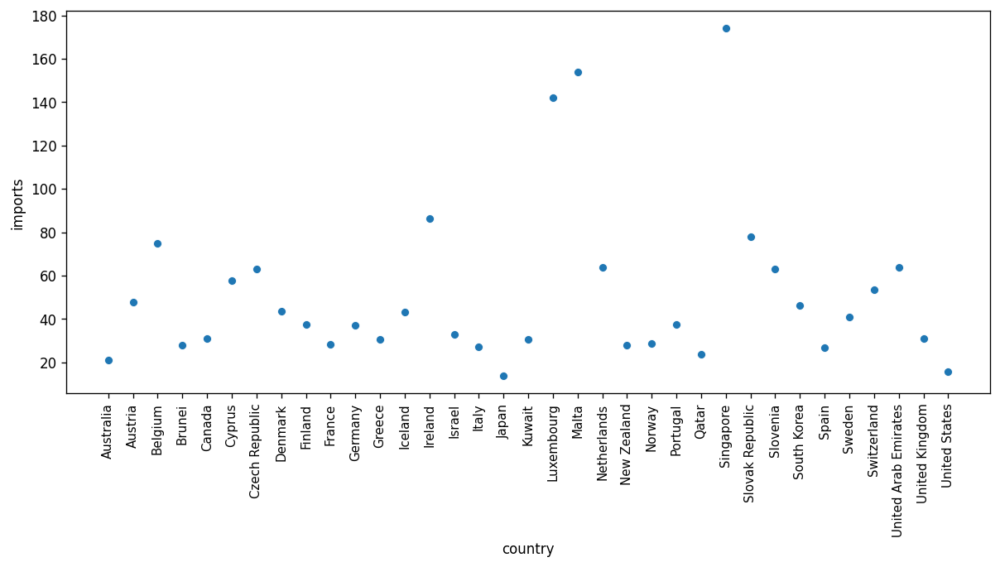

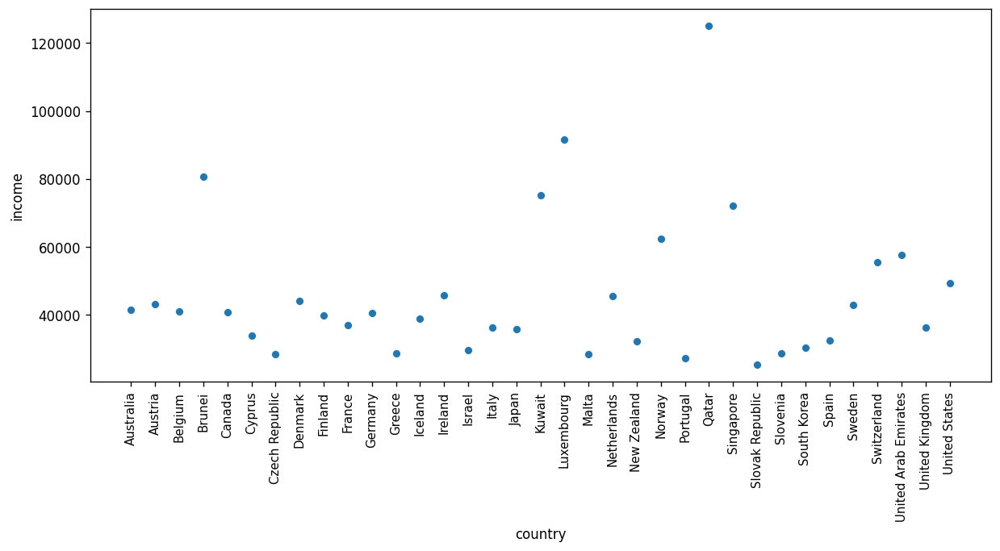

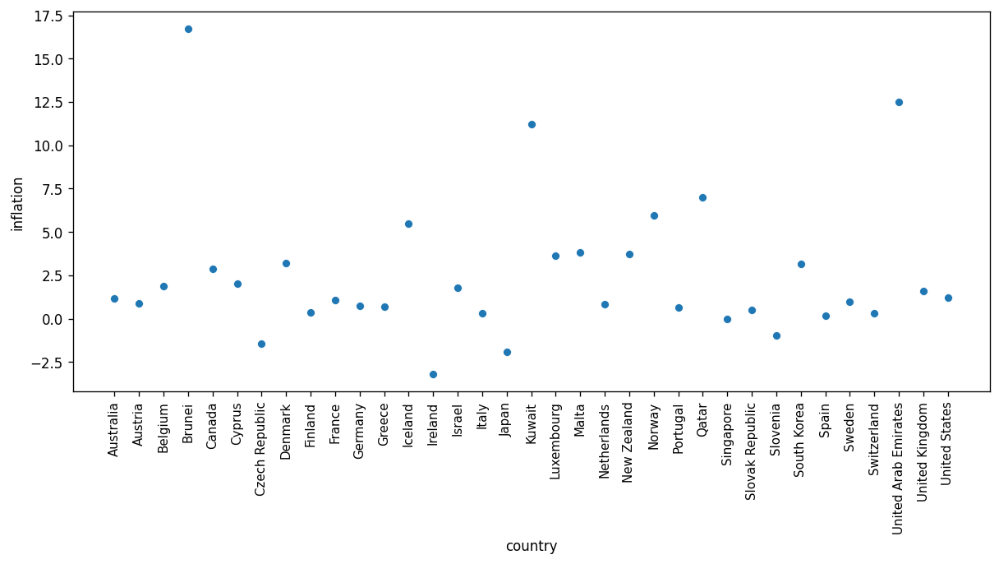

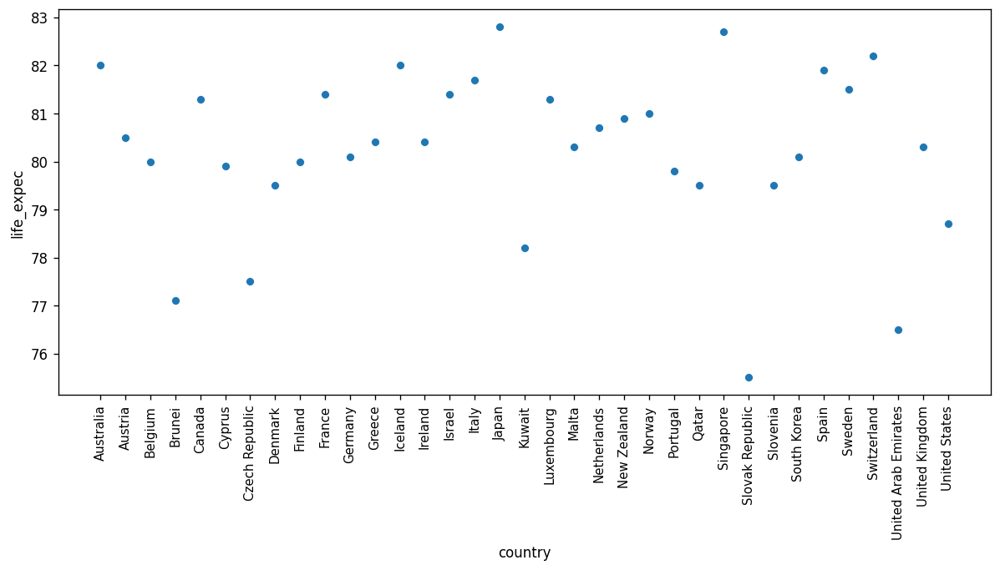

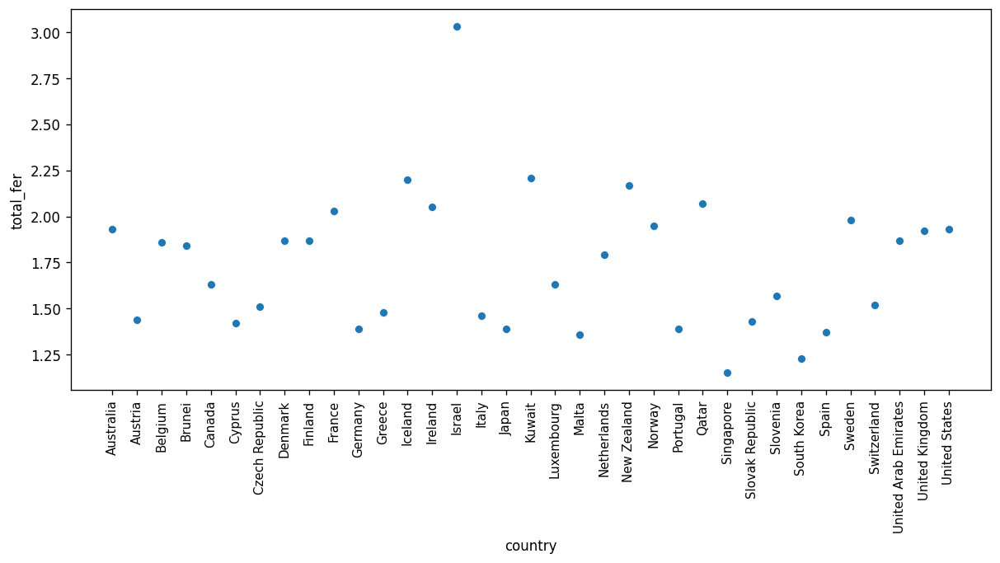

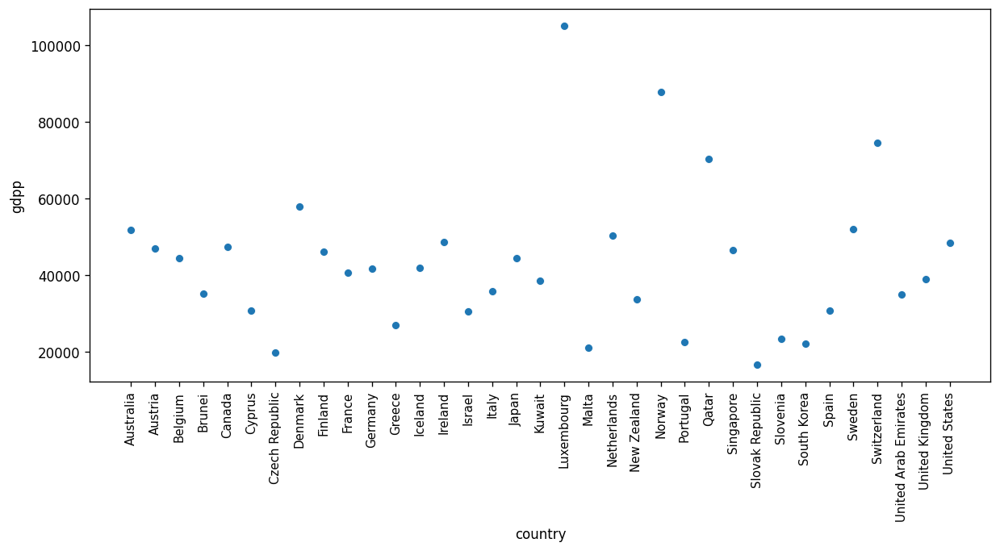

In [58]:
# scatter plot for each columns base on country
i = 0
while i < len(Data_final_1.columns):
    
        fig = plt.figure(figsize = (12, 5), dpi = 120)
        sns.scatterplot(x = Data_final_1.country, y= Data_final_1.columns[i], data = Data_final_1)
        plt.xticks(rotation=90, fontsize=9)
        i += 1
        if i == 10 :
            break
    
plt.show()

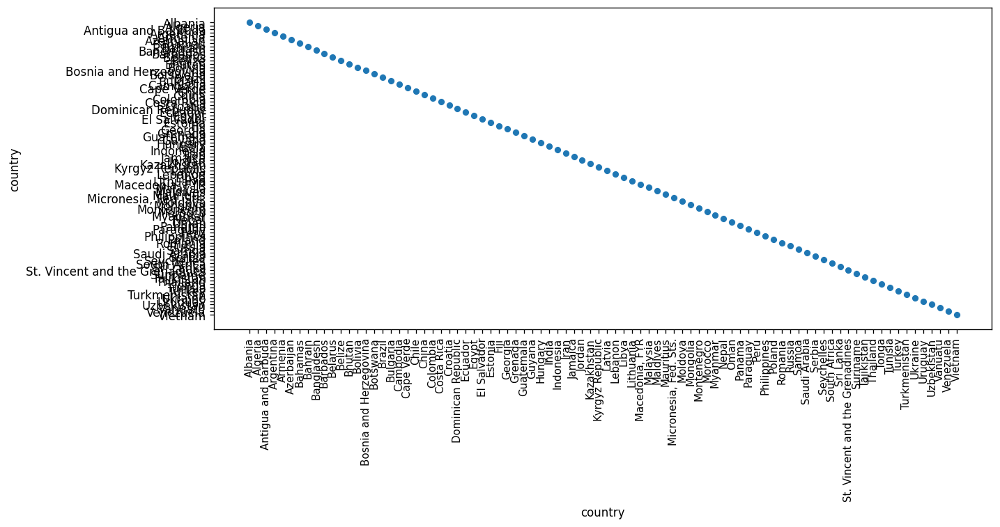

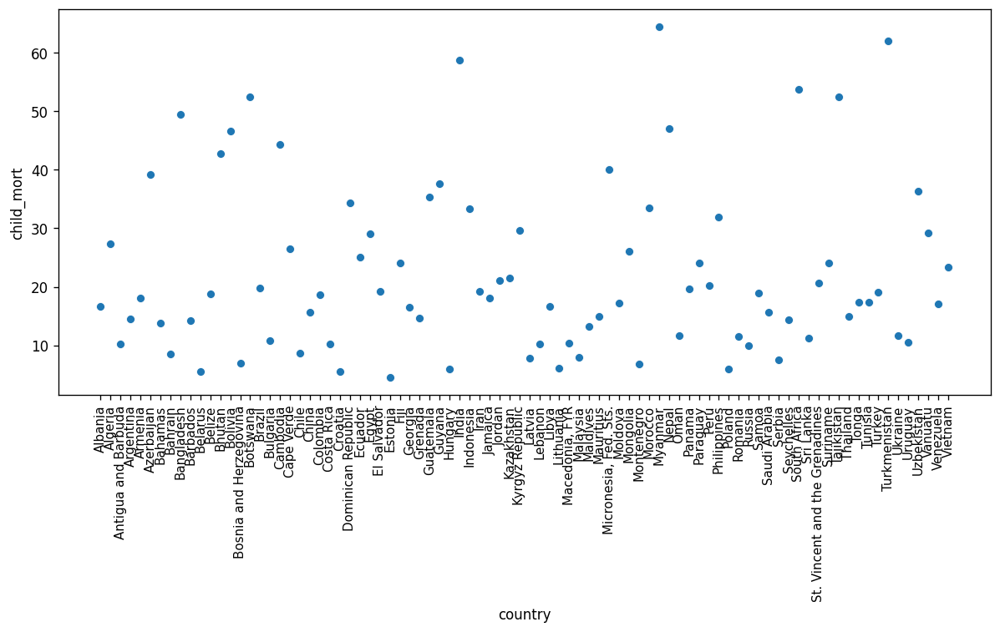

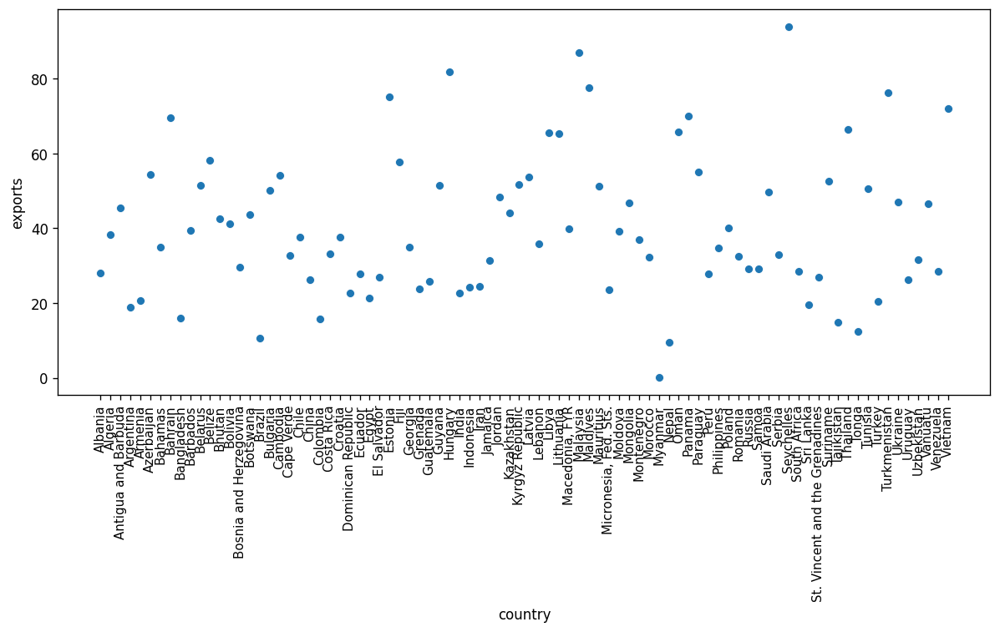

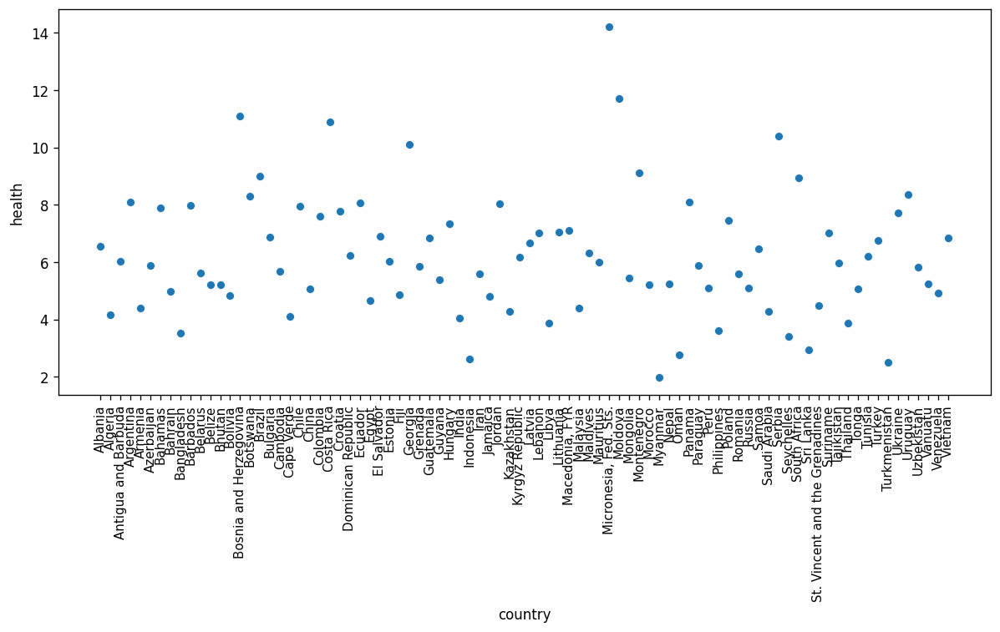

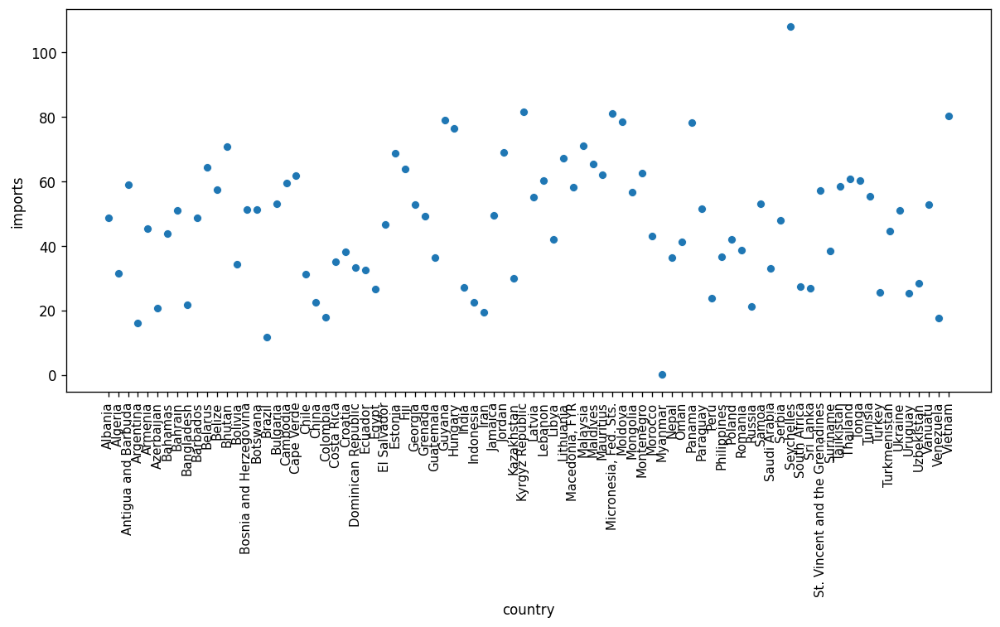

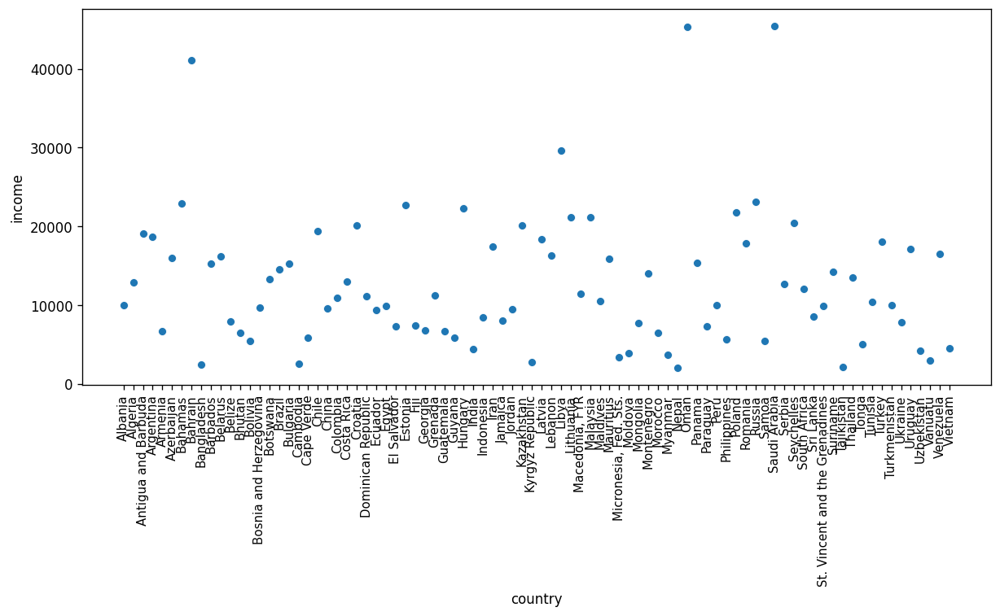

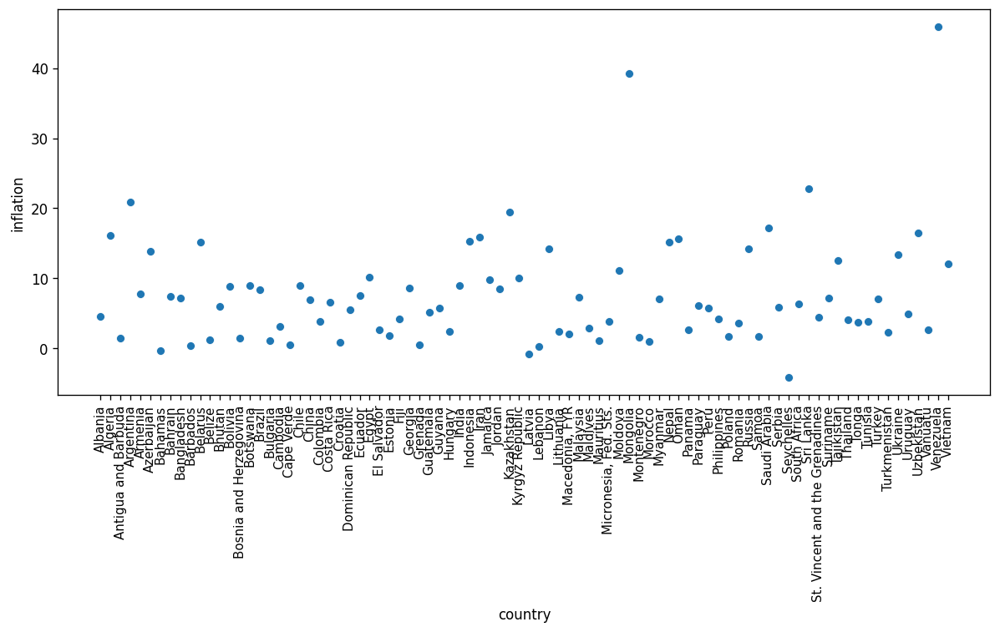

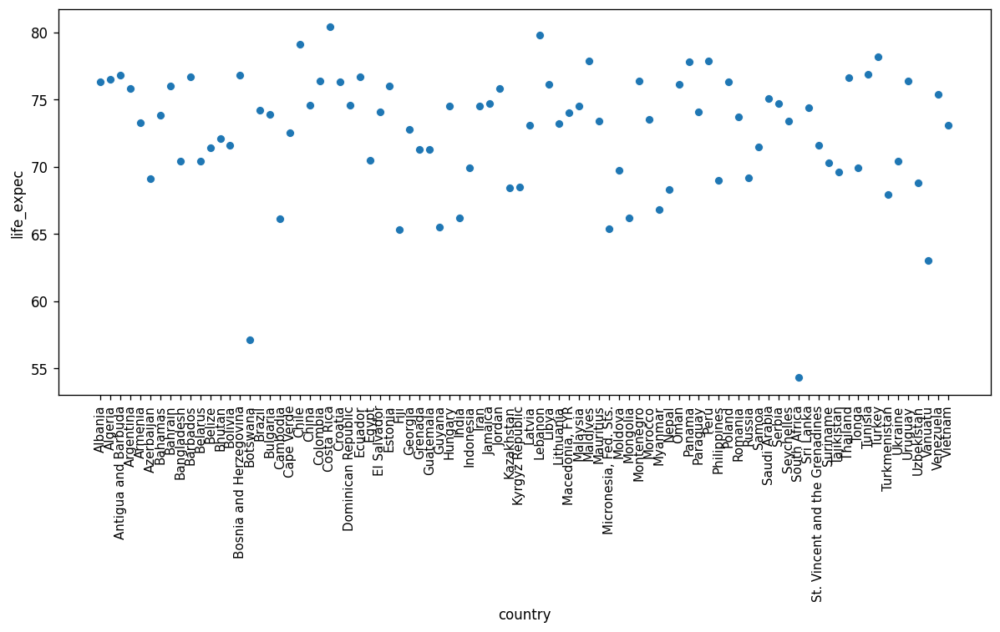

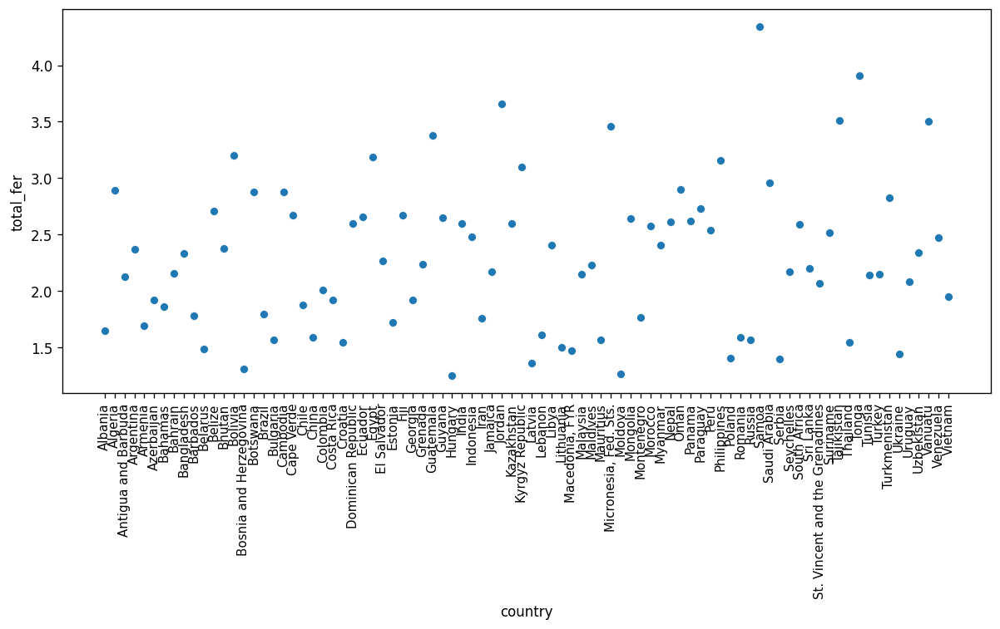

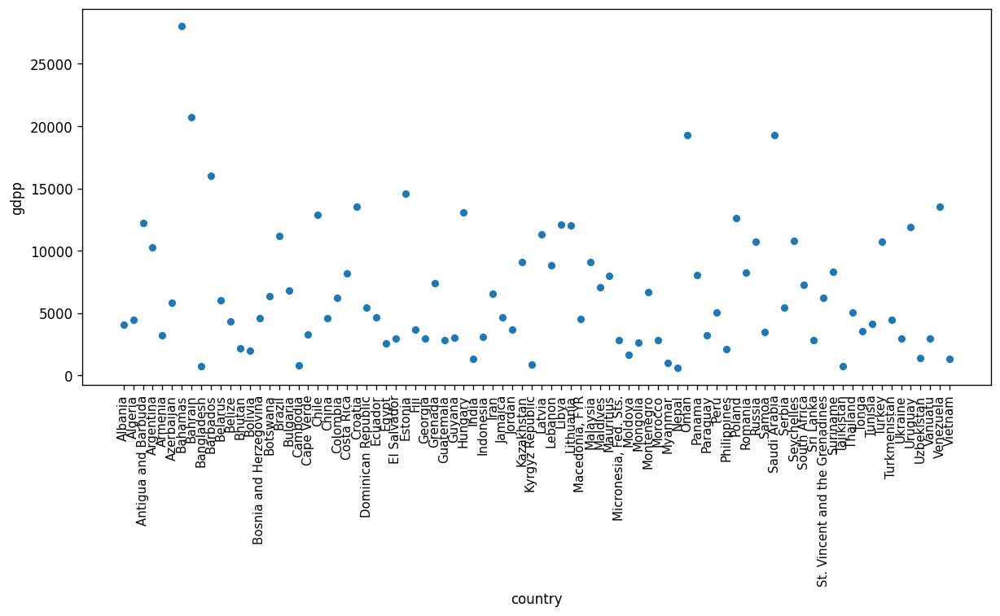

In [59]:
# scatter plot for each columns base on country
i = 0
while i < len(Data_final_2.columns):
    
        fig = plt.figure(figsize = (12, 5), dpi = 120)
        sns.scatterplot(x = Data_final_2.country, y= Data_final_2.columns[i], data = Data_final_2)
        plt.xticks(rotation=90, fontsize=9)
        i += 1
        if i == 10 :
            break
    
plt.show()

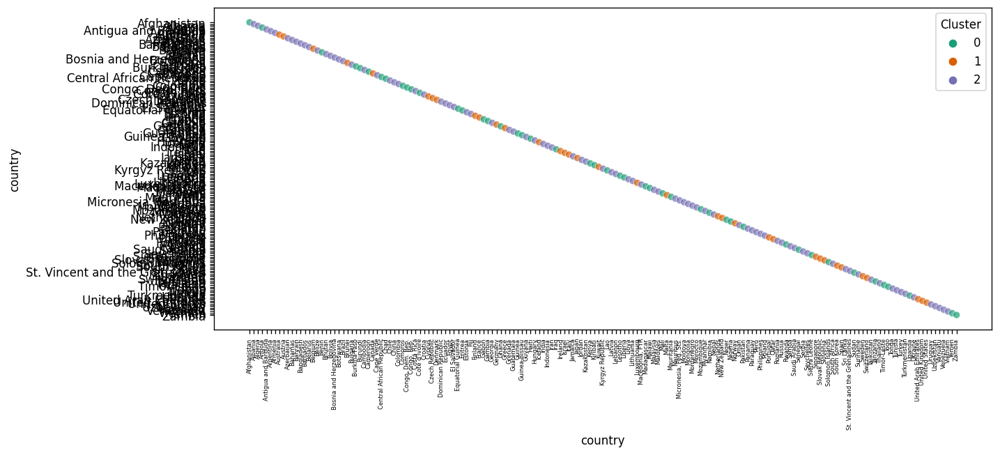

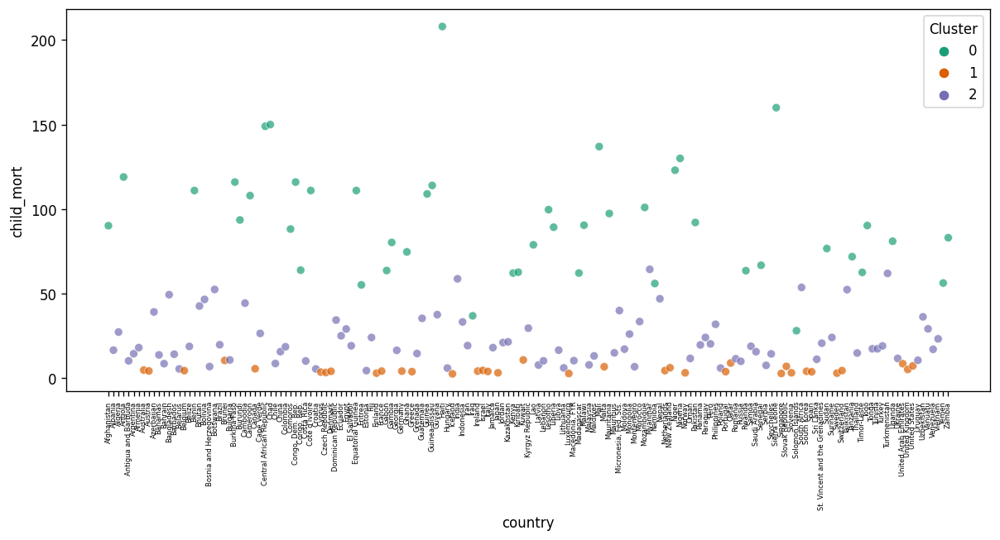

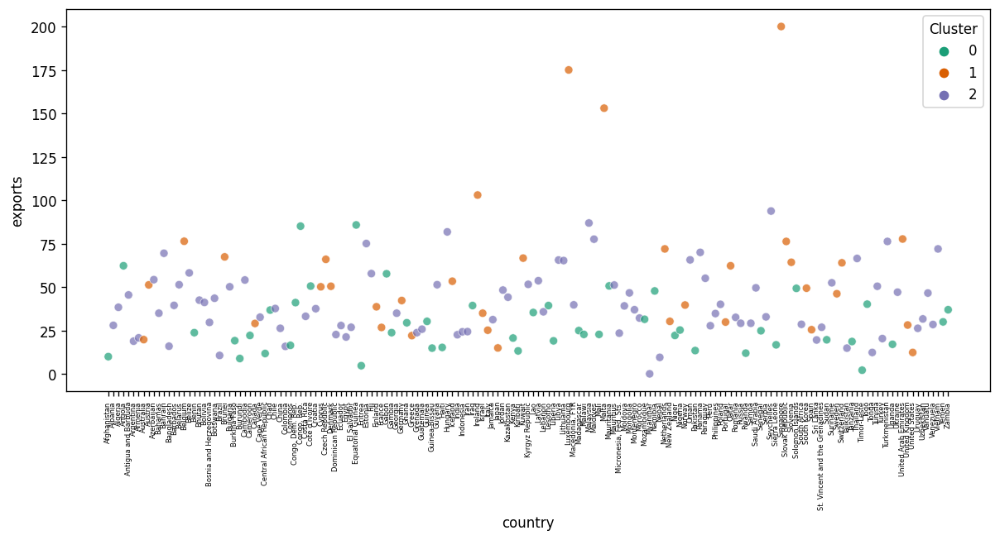

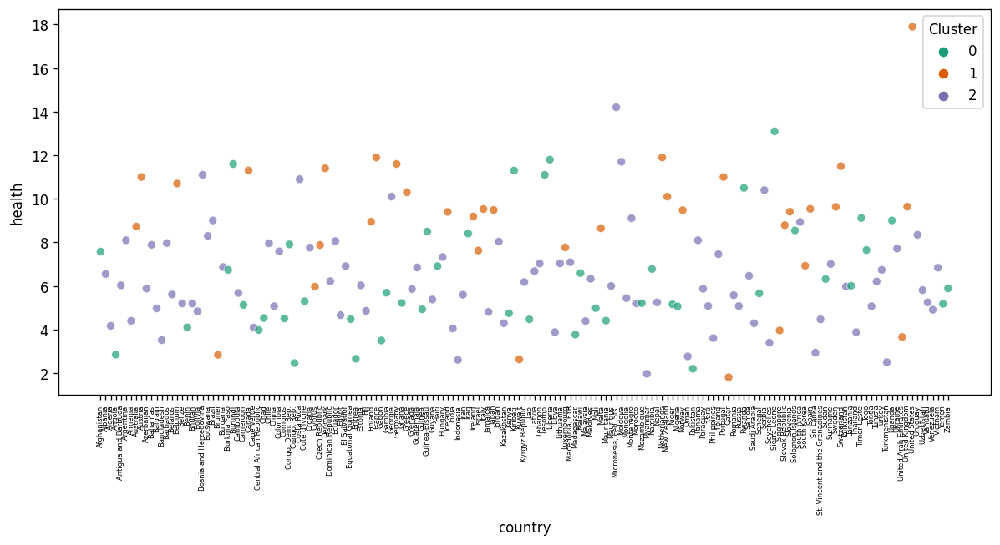

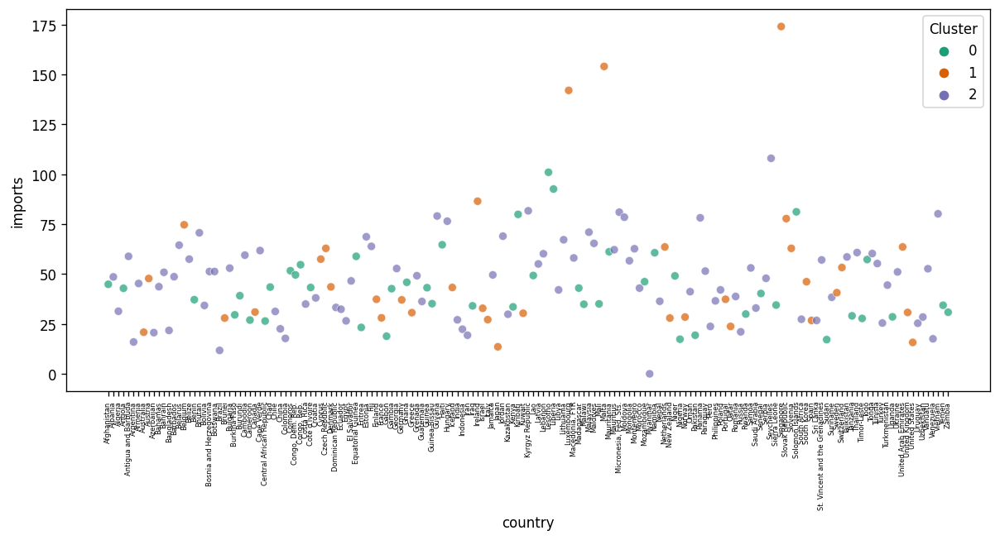

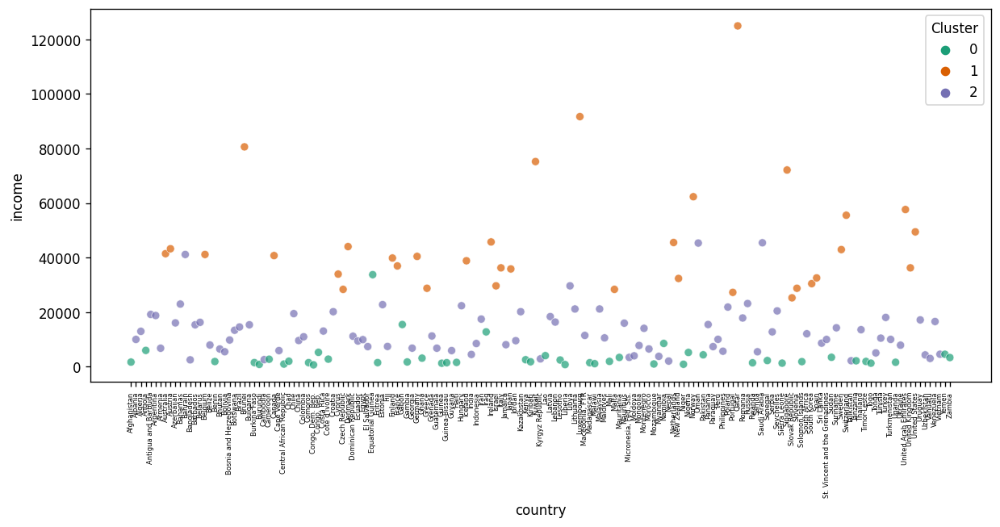

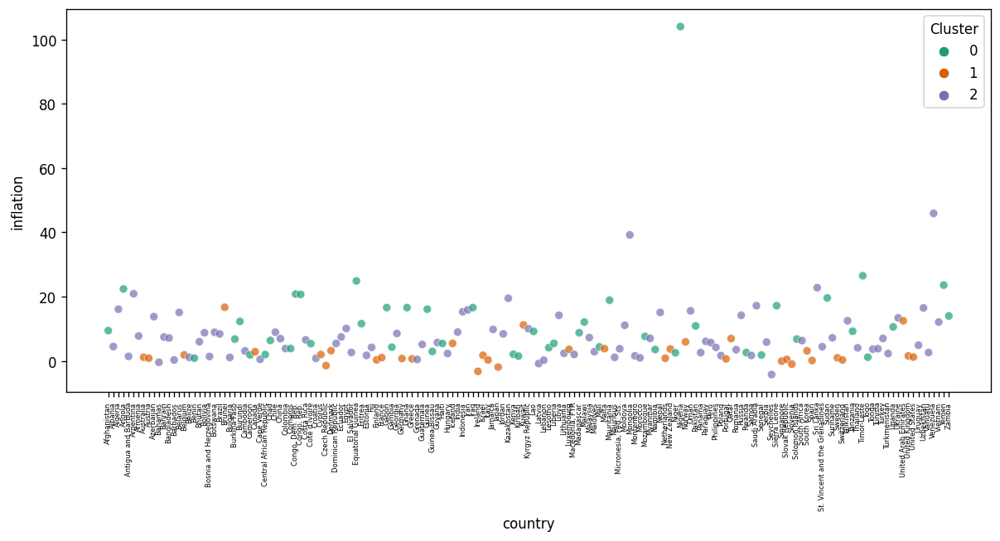

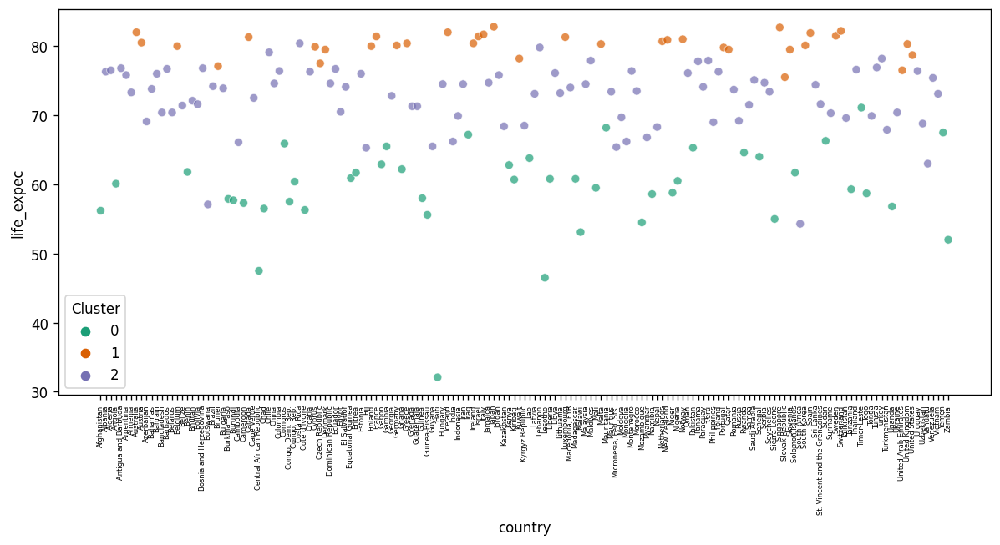

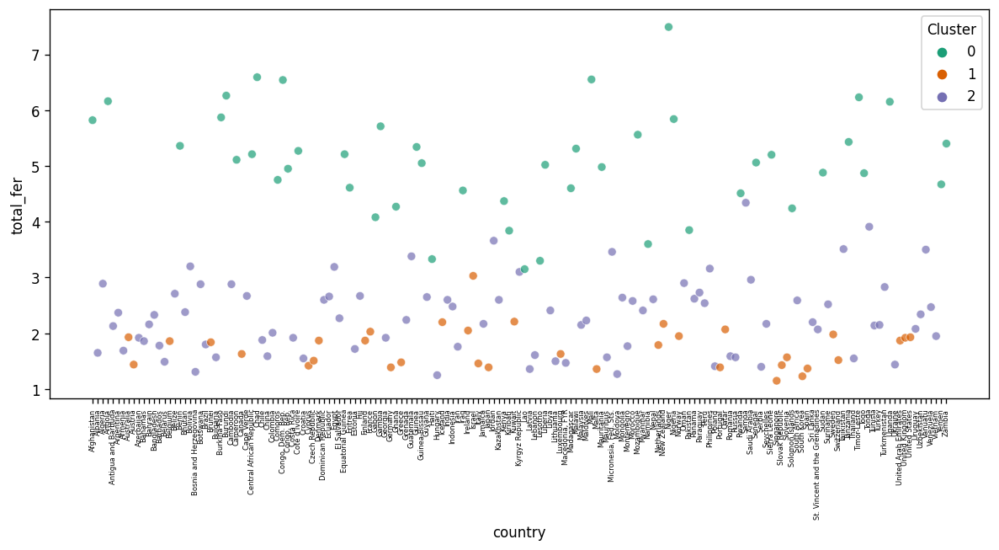

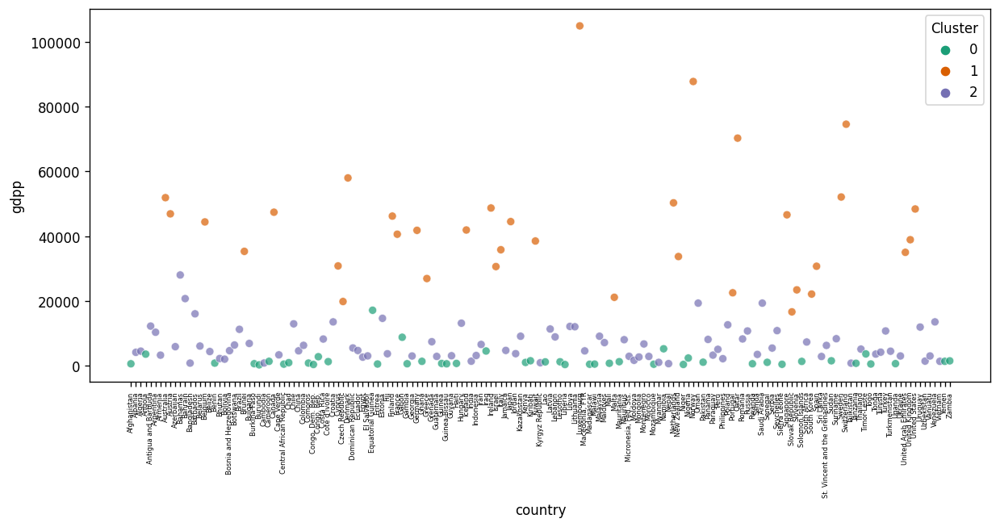

In [60]:
# scatter plot for each columns base on country and each cluster
i = 0
while i < len(Data_final.columns):
    
        fig = plt.figure(figsize = (12, 5), dpi = 120)
        sns.scatterplot(x = Data_final.country, y= Data_final.columns[i], hue='Cluster', data = Data_final, palette="Dark2",
                       alpha=0.7)
        plt.xticks(rotation=90, fontsize=5)
        i += 1
        if i == 10 :
            break
    
plt.show()

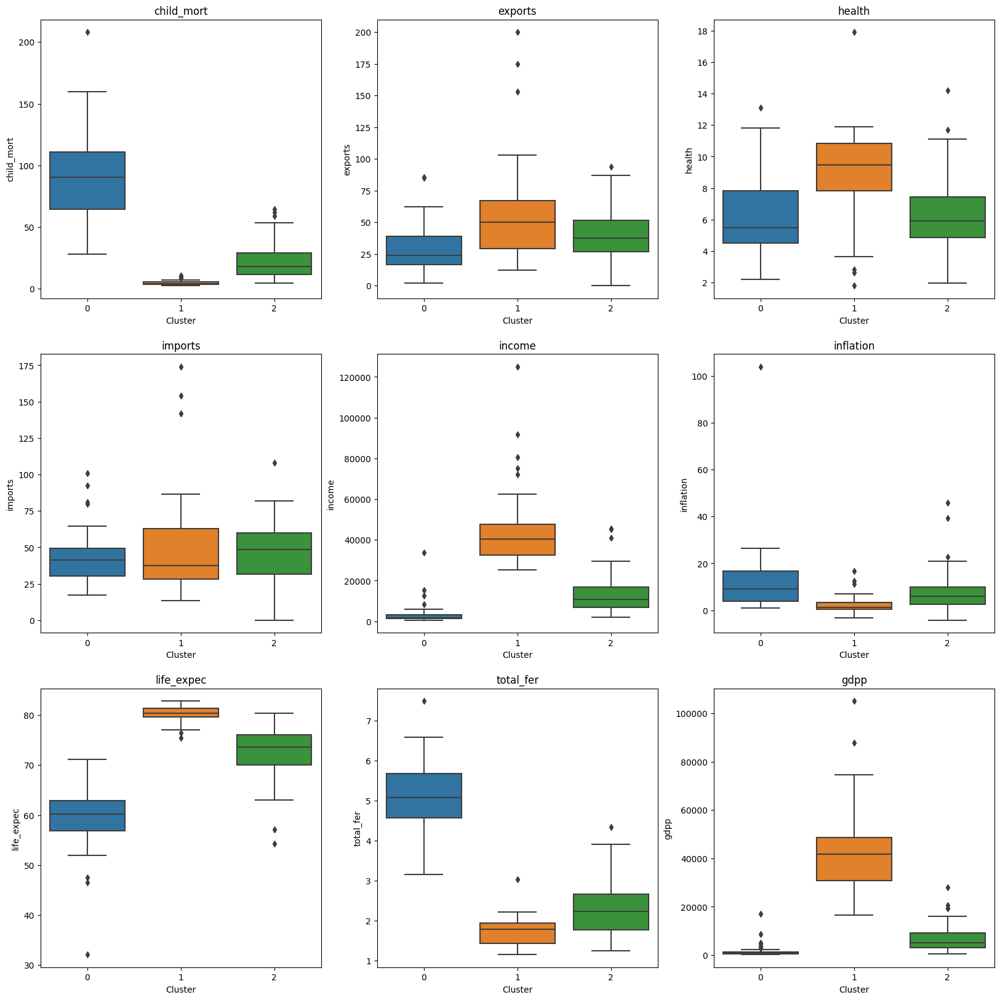

In [61]:
# make boxplot for each features by each cluster
column=['child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp']
plt.figure(figsize=(20,20))
for i in range(len(column)):
    plt.subplot(3,3,i+1)
    sns.boxplot(Data_final.Cluster,Data_final[column[i]])
    plt.title(column[i])

- Cluster 0 :   (به کمک احتیاج دارند) جهان سوم  
- Cluster 1 : جهان اول (به کمک احتیاج ندارند)
- Cluster 2 : جهان دوم (شاید به کمک احتیاج داشته باشند)

In [62]:
# plot in the world map and show each contry in wich cluster 
cat = {0:'Need Help',1:'No Help needed',2:'Might need help'} # set each cluster meaning
Data_final['Cluster']=Data_final['Cluster'].map(cat)

px.choropleth(data_frame=Data_final, locationmode='country names', locations='country', color=Data_final['Cluster'], title='Countries by category that need help',
              color_discrete_map={'Need Help':'#DB1C18','Might need help':'#DBDB3B','No Help needed':'#51A2DB'} ,projection='equirectangular')